In [1]:
from minidataset_constants import PATHS_DICTIONARY
from plot_utils import plot_clusters_from_labels, plot_grid_clusters
from data_utils import classify_zernike_coefficients_clusters
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
import numpy as np
import hdbscan
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score

In [2]:
def plot_kneighbours(data, neighbours):
    nbrs = NearestNeighbors(n_neighbors=neighbours).fit(data)
    distances, indices = nbrs.kneighbors(data)

    # Step 2: Sort and plot the distances
    distances = np.sort(distances[:, -1])
    plt.plot(distances)
    plt.ylabel(f"{neighbours}-NN Distance ")
    plt.xlabel("Points sorted by distance to nearest neighbours")
    plt.title(f"{neighbours}-NN Distance Graph")
    plt.show()

def get_number_of_clusters(data, epsilon, neighbours):
    dbscan = DBSCAN(eps=epsilon, min_samples=neighbours)
    labels = dbscan.fit_predict(data)
    #hdbscan_clusterer = hdbscan.HDBSCAN(min_cluster_size=neighbours)
    #labels = hdbscan_clusterer.fit_predict(data)
    print("Number of clusters:", np.max(labels)+1)
    mask = labels != -1
    points_that_are_not_noise = np.sum(mask)
    print("Numbers that are not noise:", points_that_are_not_noise)
    
    return labels

def plot_cluster_labels_count(labels,
                              type_of_clustering,
                              dataset_name):

    non_noise_labels = labels[labels != -1]
    counter = Counter(non_noise_labels)
    most_common = counter.most_common()[0]
    least_common = counter.most_common()[:-2:-1][0]
    print(f"The most repeated label is {most_common[0]} with {most_common[1]} occurrences.")
    print(f"The least repeated label is {least_common[0]} with {least_common[1]} occurrence.")

    keys = list(counter.keys())
    counts = list(counter.values())
    
    integers = list(counter.keys())
    
    print("Cluster density mean:", np.mean(counts))
    print("Cluster density variance:", np.std(counts))
    plt.bar(keys, counts)
    plt.xticks(integers)
    plt.xlabel('Label')
    plt.ylabel('Frequency')
    plt.title(f'Label frequency in the {dataset_name} {type_of_clustering} clustering')
    plt.savefig(f'mdid-{dataset_name}{type_of_clustering}density.png')
    plt.show()

In [3]:
minidataset_2m_dict = PATHS_DICTIONARY['MINI_2M']

# Cluster Zernike Coefficients

Load coefficients

In [4]:
zernike_coefficients = np.load(minidataset_2m_dict['zernike_mode_coefficients_path'])

Compute original labels

In [5]:
original_labels = classify_zernike_coefficients_clusters(zernike_coefficients, 
                                                         minidataset_2m_dict['labels_dictionary'])

The most repeated label is 2 with 257 occurrences.
The least repeated label is 1 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


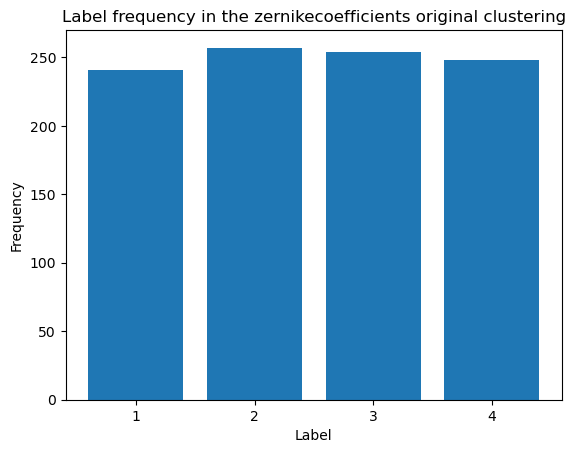

In [6]:
plot_cluster_labels_count(original_labels, 
                          'original', 
                          'zernikecoefficients')

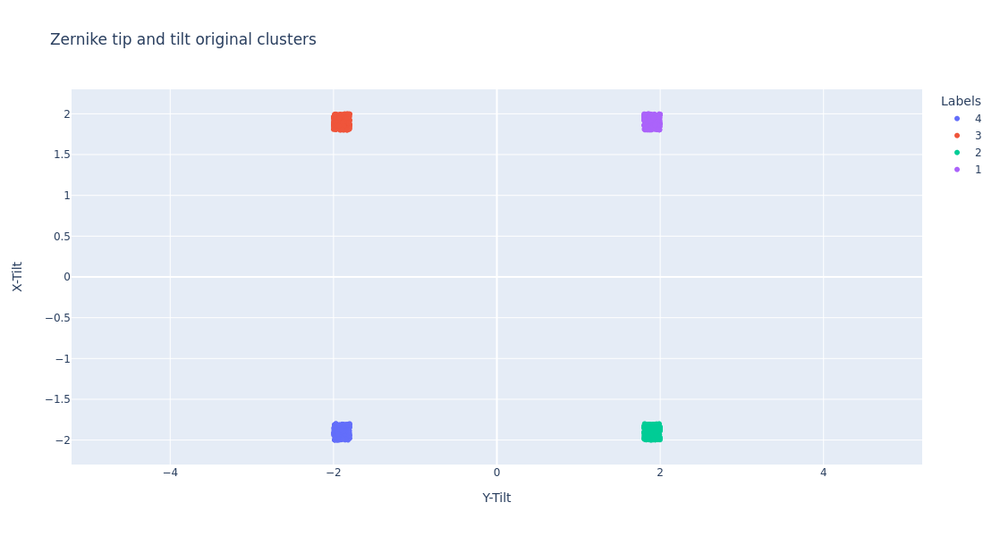

In [7]:
plot_clusters_from_labels(zernike_coefficients,
                          original_labels,
                          'Zernike tip and tilt original clusters',
                          'Y-Tilt',
                          'X-Tilt',
                          'zernikecoefficients',
                          'original')

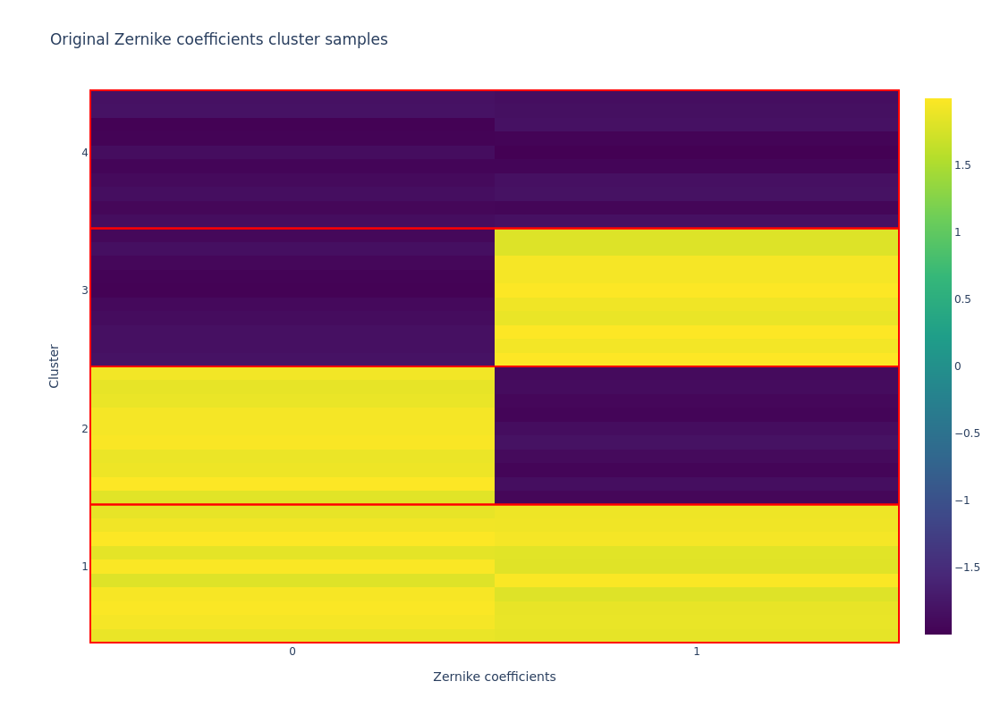

In [8]:
plot_grid_clusters(
    zernike_coefficients,
    original_labels,
    [1,2,3,4],
    "Original Zernike coefficients cluster samples",
    "Zernike coefficients",
    "Cluster",
    1,
    'zernikecoefficients',
    'original'
    )

### K-MEANS

In [9]:
kmeans = KMeans(n_clusters=4,
                n_init=10)
kmeans_labels = kmeans.fit_predict(zernike_coefficients)

The most repeated label is 0 with 257 occurrences.
The least repeated label is 3 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


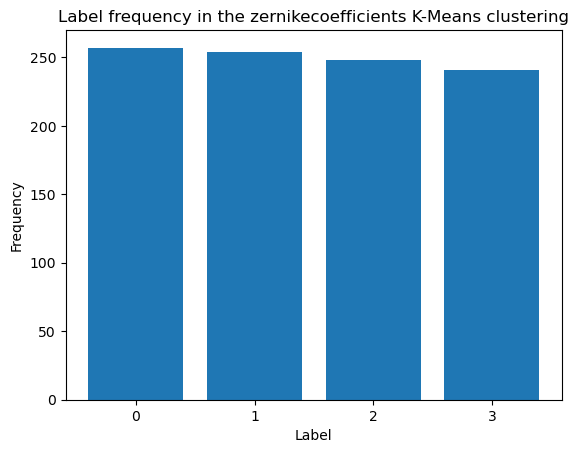

In [10]:
plot_cluster_labels_count(kmeans_labels, 'K-Means', 'zernikecoefficients')

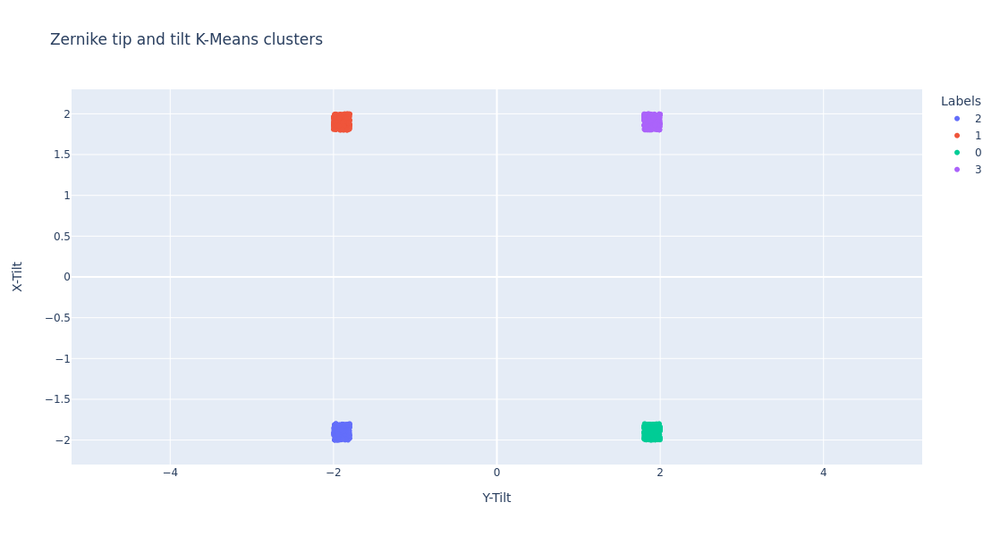

In [11]:
plot_clusters_from_labels(zernike_coefficients,
                          kmeans_labels,
                          'Zernike tip and tilt K-Means clusters',
                          'Y-Tilt',
                          'X-Tilt',
                          'zernikecoefficients',
                          'K-Means')

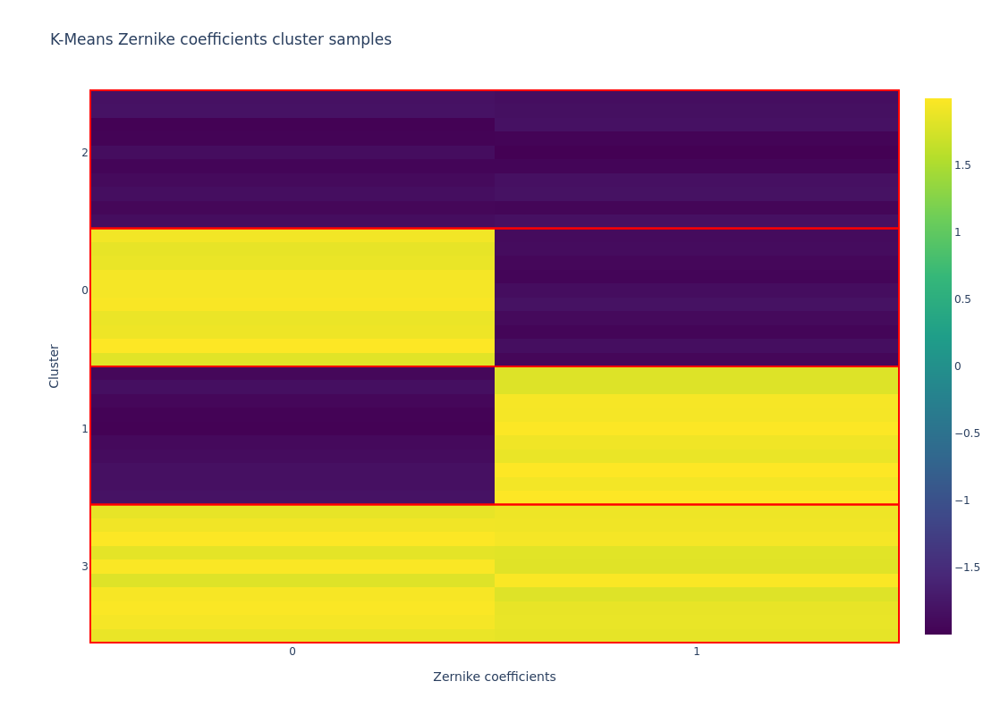

In [12]:
plot_grid_clusters(
    zernike_coefficients,
    kmeans_labels,
    [3,1,0,2],
    "K-Means Zernike coefficients cluster samples",
    "Zernike coefficients",
    "Cluster",
    1,
    'zernikecoefficients',
    'K-Means'
    )

### DBSCAN

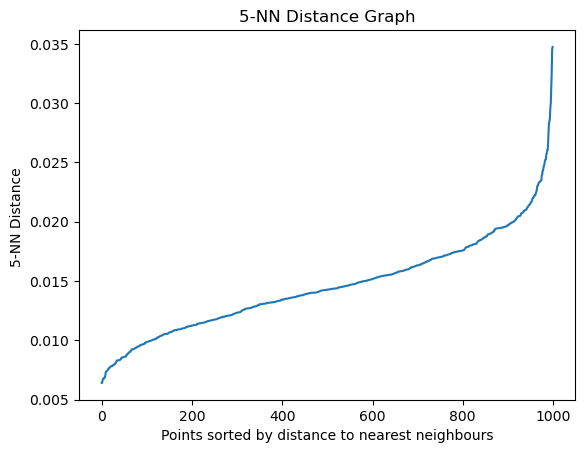

Number of clusters: 4
Numbers that are not noise: 1000


In [13]:
n_neighbours = 5
plot_kneighbours(zernike_coefficients, n_neighbours)
epsilon = 0.03
dbscan_labels = get_number_of_clusters(zernike_coefficients, epsilon, n_neighbours)

The most repeated label is 2 with 257 occurrences.
The least repeated label is 3 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


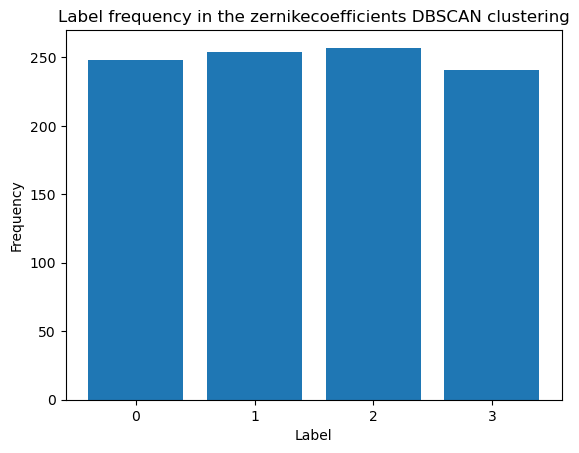

In [14]:
plot_cluster_labels_count(dbscan_labels, 
                          'DBSCAN',
                          'zernikecoefficients')

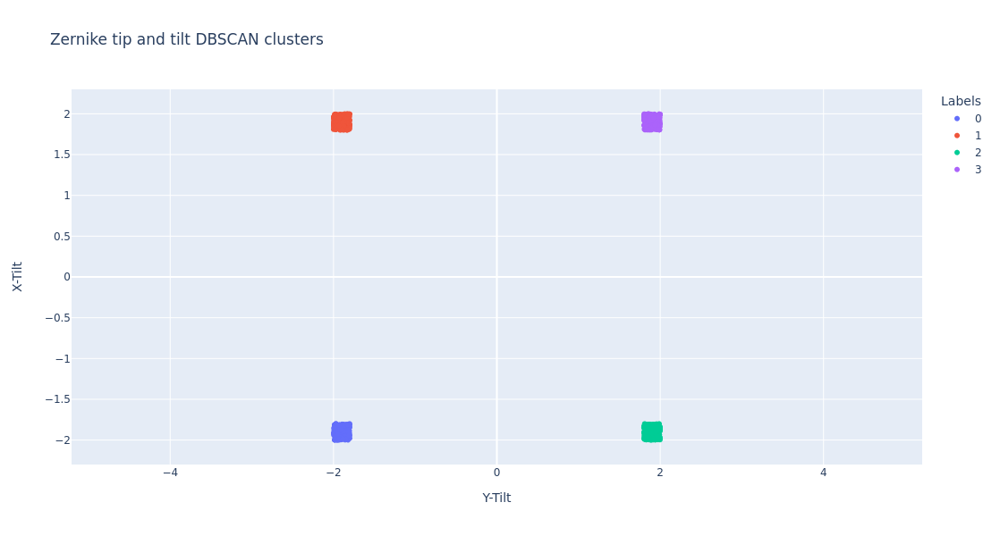

In [15]:
plot_clusters_from_labels(zernike_coefficients,
                          dbscan_labels,
                          'Zernike tip and tilt DBSCAN clusters',
                          'Y-Tilt',
                          'X-Tilt',
                          'zernikecoefficients',
                          'DBSCAN')

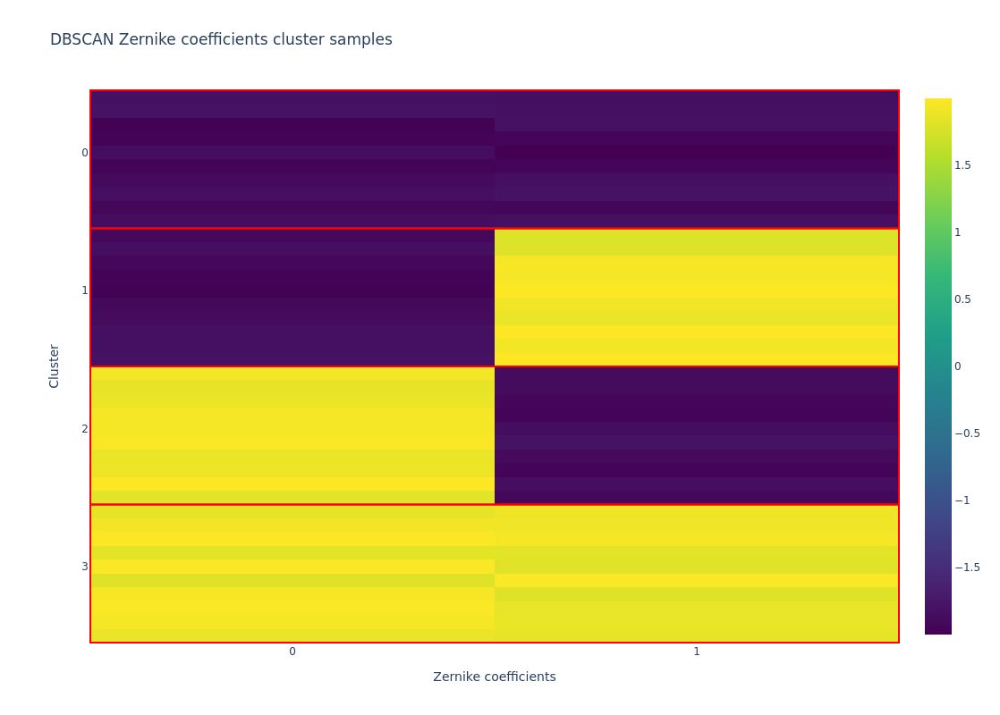

In [16]:
plot_grid_clusters(
    zernike_coefficients,
    dbscan_labels,
    [3,2,1,0],
    "DBSCAN Zernike coefficients cluster samples",
    "Zernike coefficients",
    "Cluster",
    1,
    'zernikecoefficients',
    'DBSCAN'
    )

### HDBSCAN

In [17]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=100)
hdbscan_labels = clusterer.fit_predict(zernike_coefficients)

The most repeated label is 0 with 257 occurrences.
The least repeated label is 3 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


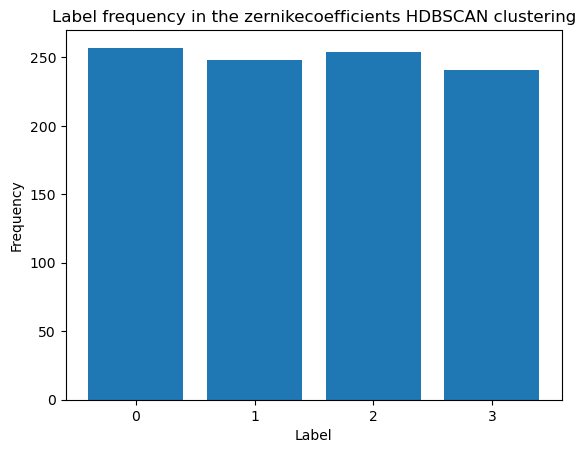

In [18]:
plot_cluster_labels_count(hdbscan_labels, 
                          'HDBSCAN', 
                          'zernikecoefficients')

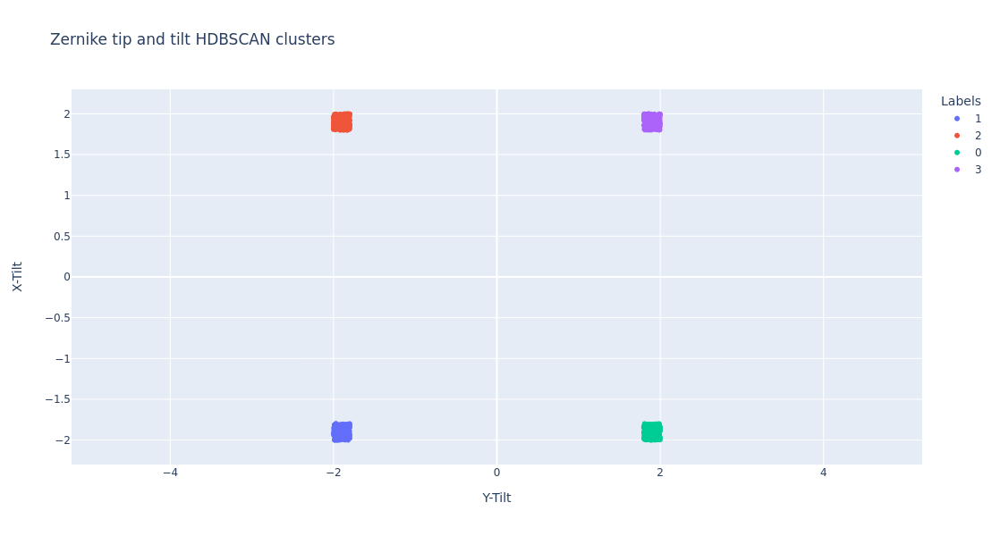

In [19]:
plot_clusters_from_labels(zernike_coefficients,
                          hdbscan_labels,
                          'Zernike tip and tilt HDBSCAN clusters',
                          'Y-Tilt',
                          'X-Tilt',
                         'zernikecoefficients',
                         'HDBSCAN')

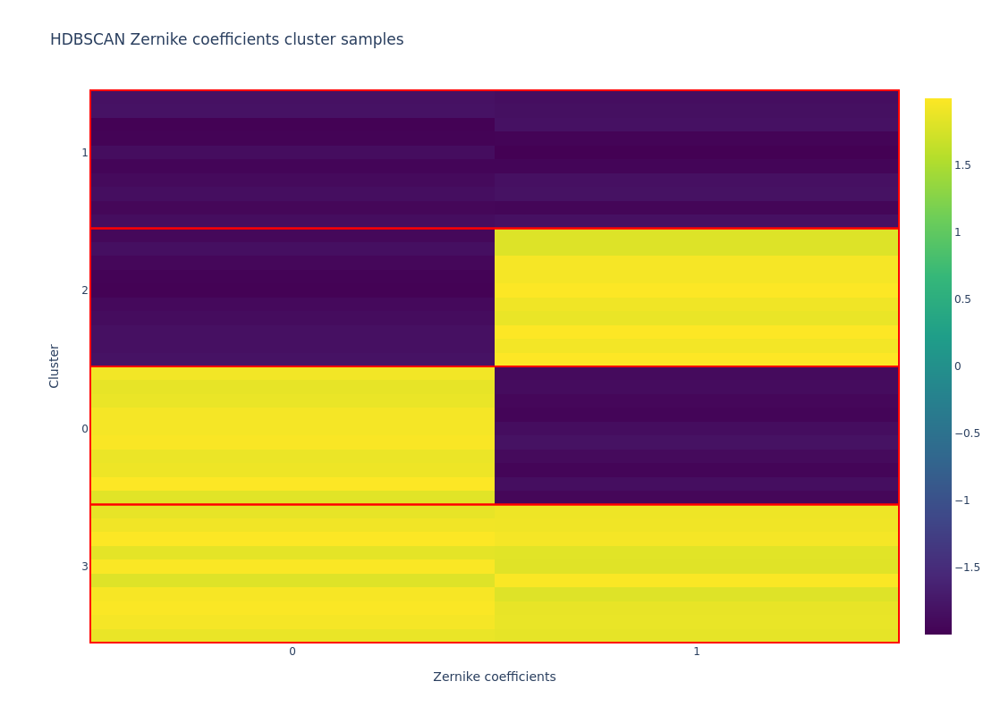

In [20]:
plot_grid_clusters(
    zernike_coefficients,
    hdbscan_labels,
    [3,0,2,1],
    "HDBSCAN Zernike coefficients cluster samples",
    "Zernike coefficients",
    "Cluster",
    1,
    'zernikecoefficients',
    'HDBSCAN'
    )

### Agglomerative clustering

In [21]:
agglomerativeclustering = AgglomerativeClustering(n_clusters=4)
agglomerative_labels = agglomerativeclustering.fit_predict(zernike_coefficients)

The most repeated label is 1 with 257 occurrences.
The least repeated label is 3 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


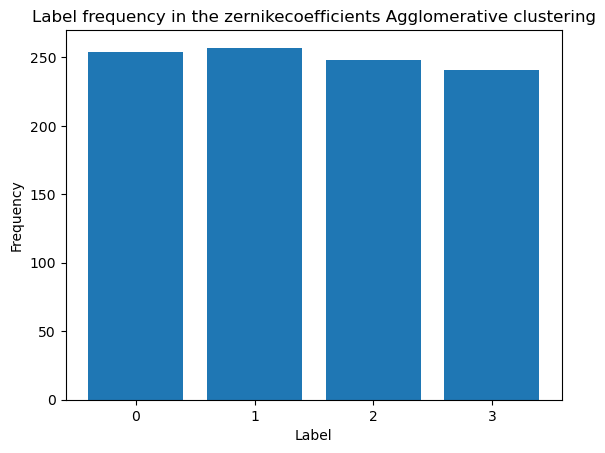

In [22]:
plot_cluster_labels_count(agglomerative_labels, 'Agglomerative', 'zernikecoefficients')

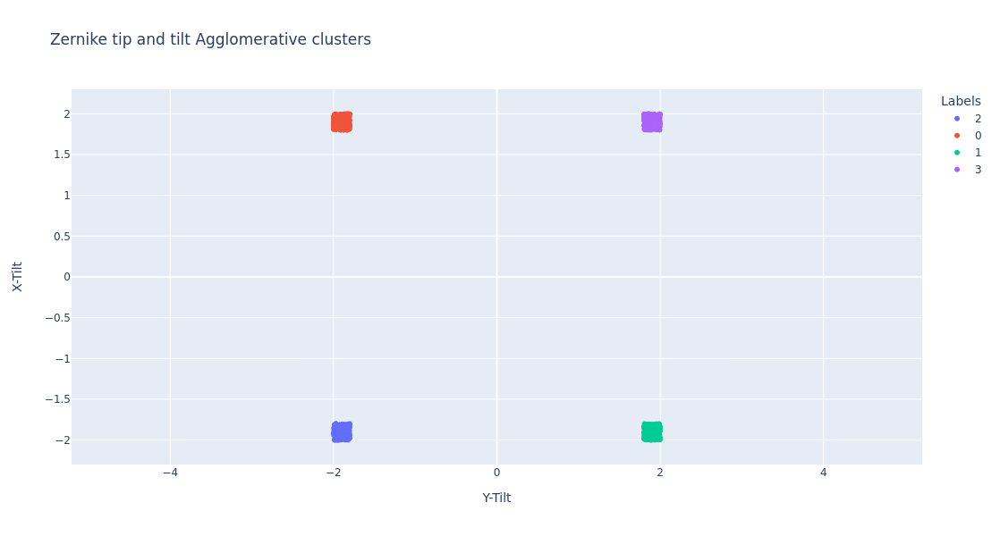

In [23]:
plot_clusters_from_labels(zernike_coefficients,
                          agglomerative_labels,
                          'Zernike tip and tilt Agglomerative clusters',
                          'Y-Tilt',
                          'X-Tilt',
                          'zernikecoefficients',
                          'Agglomerative')

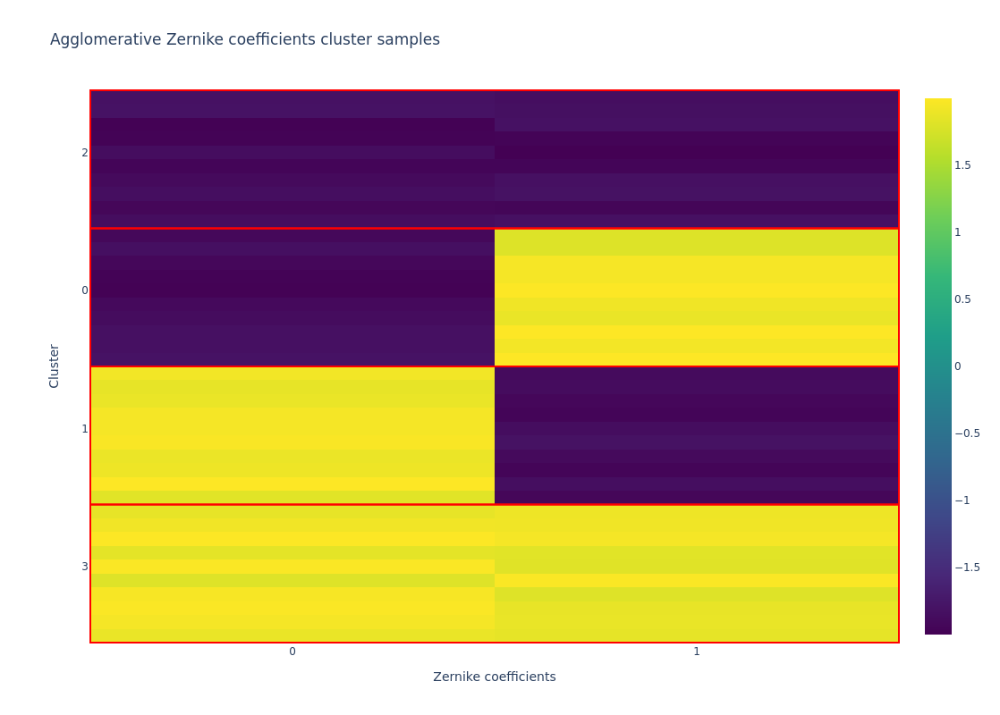

In [24]:
plot_grid_clusters(
    zernike_coefficients,
    agglomerative_labels,
    [3,1,0,2,],
    "Agglomerative Zernike coefficients cluster samples",
    "Zernike coefficients",
    "Cluster",
    1,
    'zernikecoefficients',
    'Agglomerative'
    )

In [25]:
print(normalized_mutual_info_score(kmeans_labels, original_labels))
print(normalized_mutual_info_score(dbscan_labels, original_labels))
print(normalized_mutual_info_score(hdbscan_labels, original_labels))
print(normalized_mutual_info_score(agglomerative_labels, original_labels))

print(normalized_mutual_info_score(dbscan_labels, kmeans_labels))
print(normalized_mutual_info_score(hdbscan_labels, kmeans_labels))
print(normalized_mutual_info_score(agglomerative_labels, kmeans_labels))

print(normalized_mutual_info_score(hdbscan_labels, dbscan_labels))
print(normalized_mutual_info_score(agglomerative_labels, dbscan_labels))

print(normalized_mutual_info_score(agglomerative_labels, original_labels))

1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0


# Clustering LP coefficients

In [26]:
lp_coefficients = np.load(minidataset_2m_dict['lp_modes_path']).reshape(1000, 2*19)

The most repeated label is 2 with 257 occurrences.
The least repeated label is 1 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


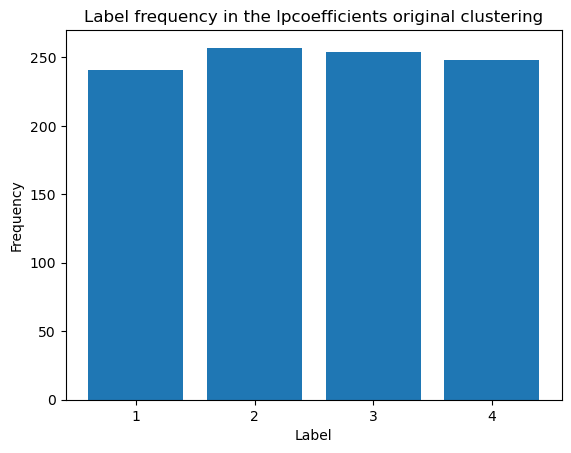

In [27]:
plot_cluster_labels_count(original_labels, 
                          'original',
                          'lpcoefficients')

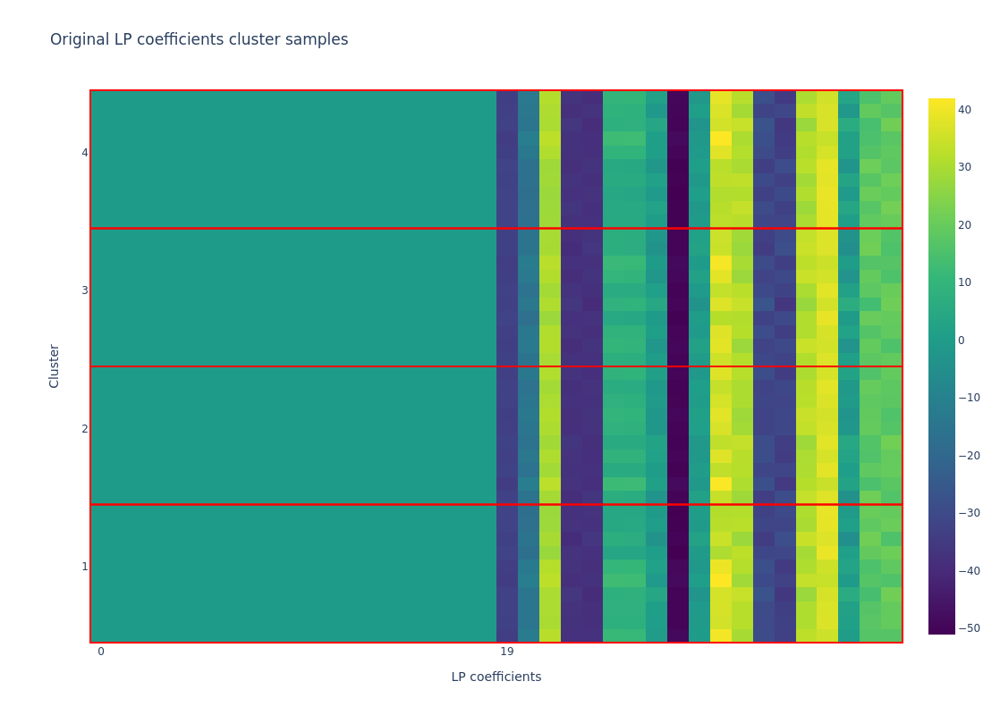

In [28]:
plot_grid_clusters(
    lp_coefficients,
    original_labels,
    [1,2,3,4],
    "Original LP coefficients cluster samples",
    "LP coefficients",
    "Cluster",
    19,
    'lpcoefficients',
    'original'
    )

### K-Means

In [29]:
kmeans = KMeans(n_clusters=4,
                n_init=10)
kmeans_labels = kmeans.fit_predict(lp_coefficients)

The most repeated label is 1 with 262 occurrences.
The least repeated label is 0 with 239 occurrence.
Cluster density mean: 250.0
Cluster density variance: 8.215838362577491


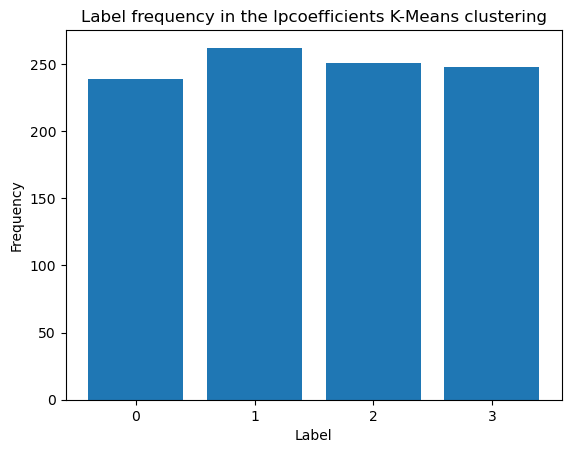

In [30]:
plot_cluster_labels_count(kmeans_labels, 
                          'K-Means',
                          'lpcoefficients')

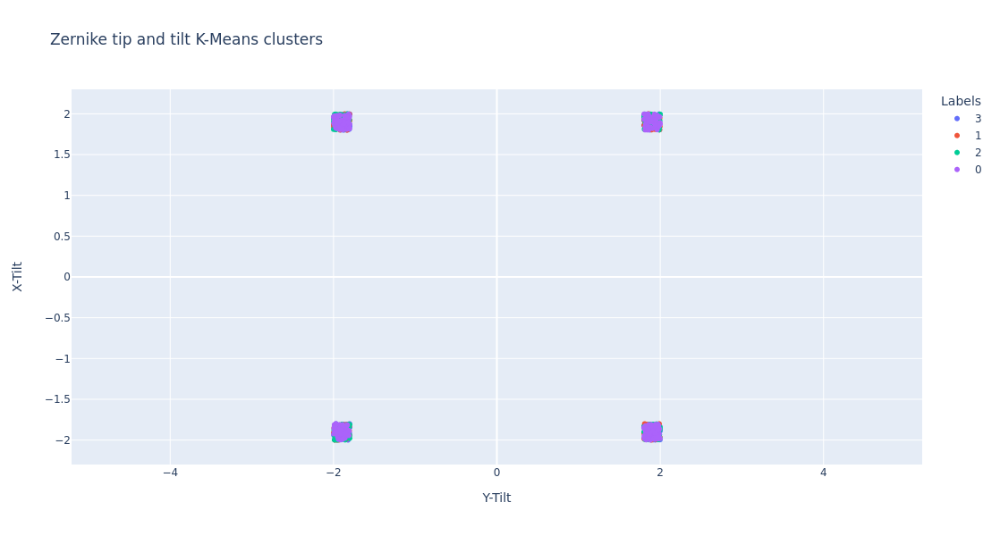

In [31]:
plot_clusters_from_labels(zernike_coefficients,
                          kmeans_labels,
                          'Zernike tip and tilt K-Means clusters',
                          'Y-Tilt',
                          'X-Tilt',
                          'lpcoefficients',
                          'K-Means')

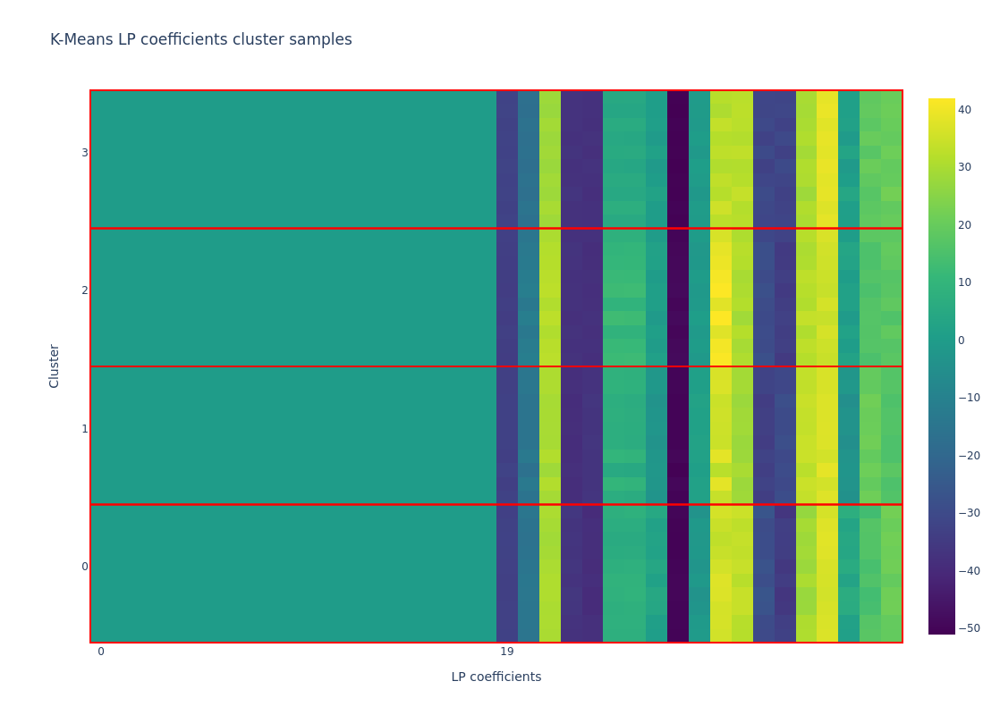

In [32]:
plot_grid_clusters(
    lp_coefficients,
    kmeans_labels,
    [0,1,2,3],
    "K-Means LP coefficients cluster samples",
    "LP coefficients",
    "Cluster",
    19,
    'lpcoefficients',
    'K-Means'
    )

### DBSCAN

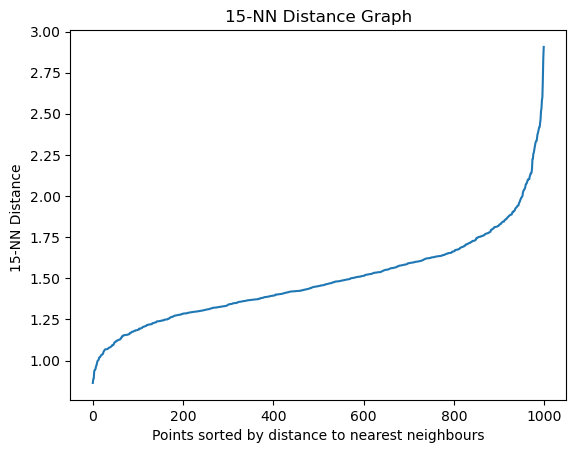

Number of clusters: 4
Numbers that are not noise: 949


In [33]:
n_neighbours = 15
plot_kneighbours(lp_coefficients, n_neighbours)
epsilon = 1.52
dbscan_labels = get_number_of_clusters(lp_coefficients, epsilon, n_neighbours)

The most repeated label is 0 with 861 occurrences.
The least repeated label is 3 with 14 occurrence.
Cluster density mean: 237.25
Cluster density variance: 360.61154654281387


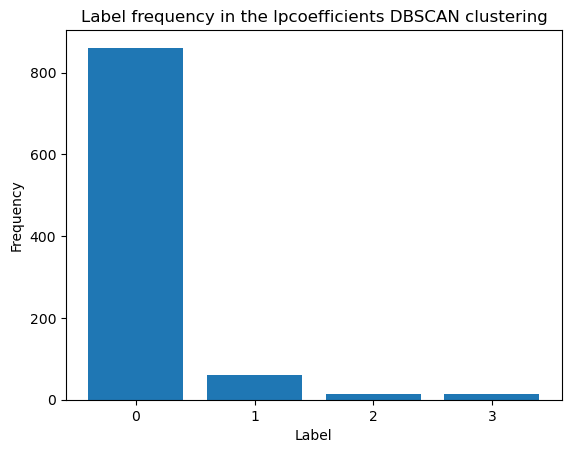

In [34]:
plot_cluster_labels_count(dbscan_labels, 'DBSCAN', 'lpcoefficients')

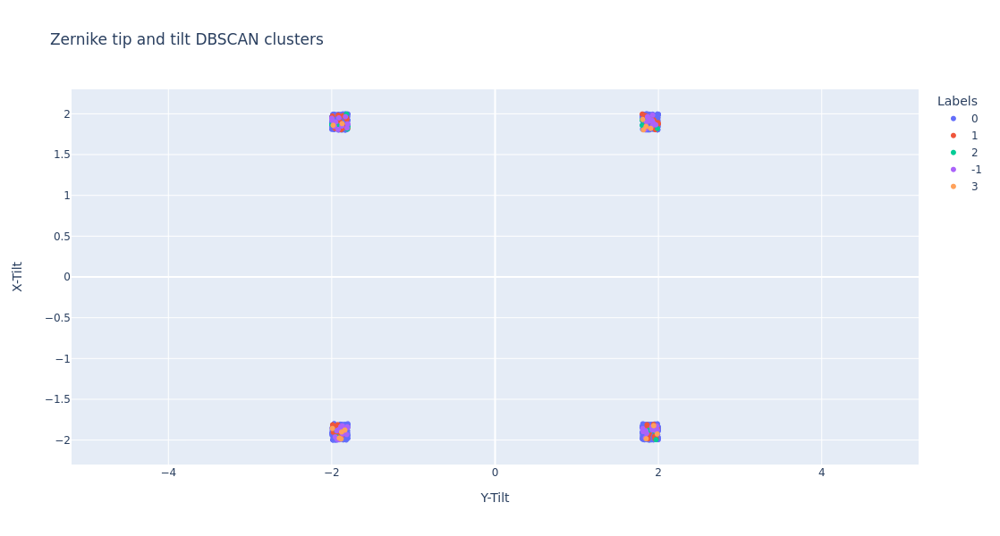

In [35]:
plot_clusters_from_labels(zernike_coefficients,
                          dbscan_labels,
                          'Zernike tip and tilt DBSCAN clusters',
                          'Y-Tilt',
                          'X-Tilt',
                          'lpcoefficients',
                          'DBSCAN')

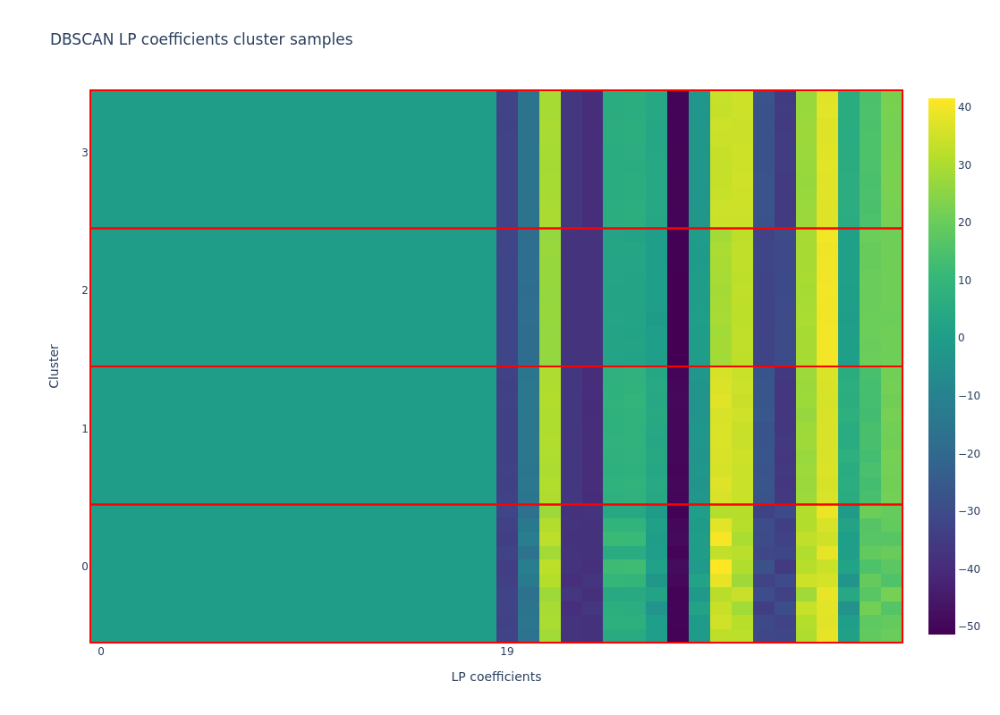

In [36]:
plot_grid_clusters(
    lp_coefficients,
    dbscan_labels,
    [0,1,2,3],
    "DBSCAN LP coefficients cluster samples",
    "LP coefficients",
    "Cluster",
    19,
    'lpcoefficients',
    'DBSCAN'
    )

### HDBSCAN

In [37]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=21)
hdbscan_labels = clusterer.fit_predict(lp_coefficients)

The most repeated label is 2 with 168 occurrences.
The least repeated label is 3 with 21 occurrence.
Cluster density mean: 89.0
Cluster density variance: 64.5174395028197


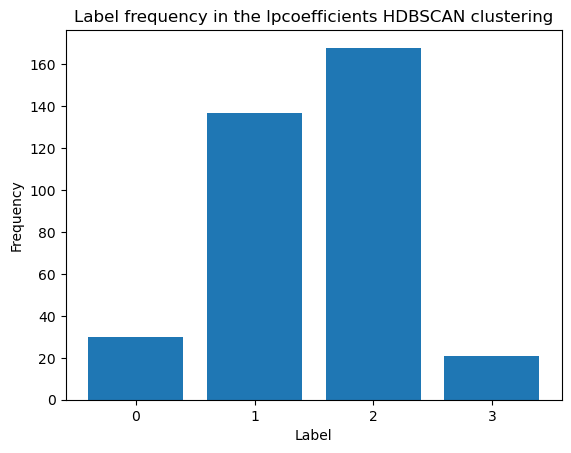

In [38]:
plot_cluster_labels_count(hdbscan_labels, 'HDBSCAN', 'lpcoefficients')

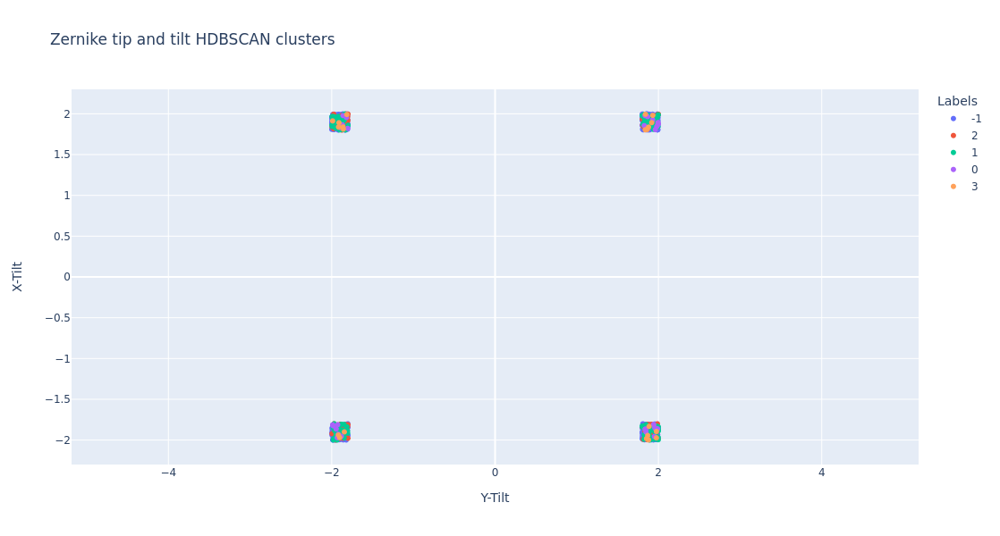

In [39]:
plot_clusters_from_labels(zernike_coefficients,
                          hdbscan_labels,
                          'Zernike tip and tilt HDBSCAN clusters',
                          'Y-Tilt',
                          'X-Tilt',
                          'lpcoefficients',
                          'HDBSCAN'
                          )

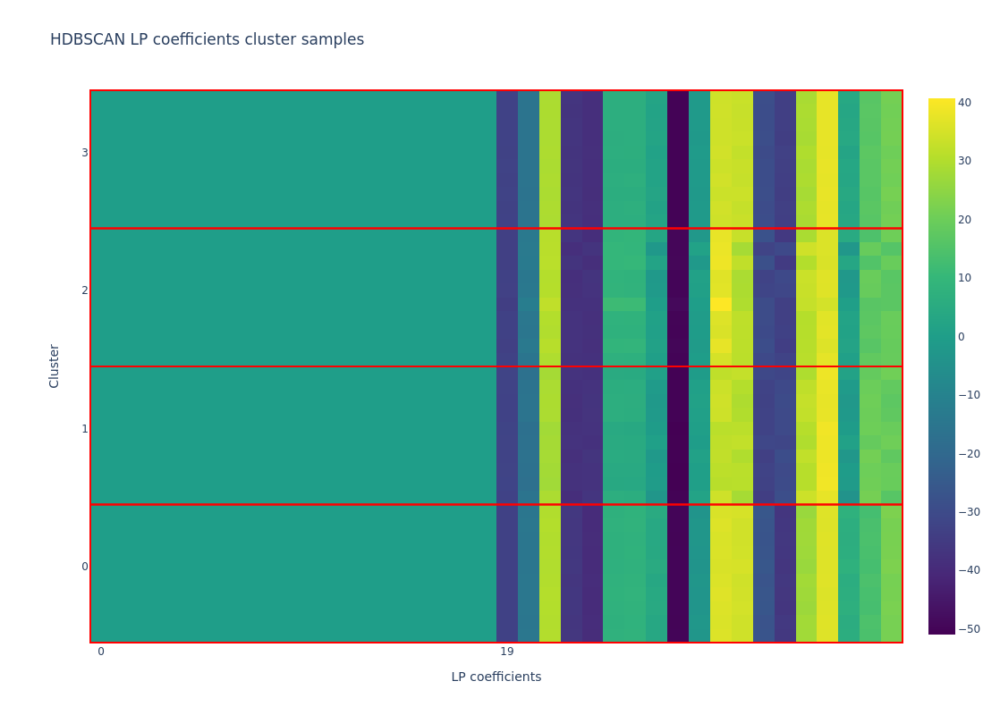

In [40]:
plot_grid_clusters(
    lp_coefficients,
    hdbscan_labels,
    [0,1,2,3],
    "HDBSCAN LP coefficients cluster samples",
    "LP coefficients",
    "Cluster",
    19,
    'lpcoefficients',
    'HDBSCAN'
    )

### Agglomerative clustering

In [41]:
agglomerativeclustering = AgglomerativeClustering(n_clusters=4)
agglomerative_labels = agglomerativeclustering.fit_predict(lp_coefficients)

The most repeated label is 1 with 299 occurrences.
The least repeated label is 3 with 198 occurrence.
Cluster density mean: 250.0
Cluster density variance: 36.13170353027933


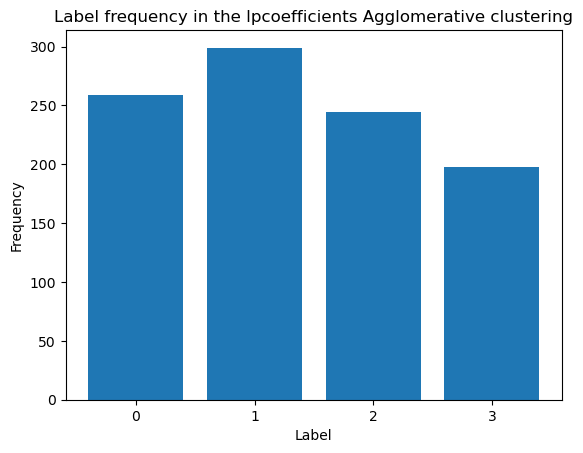

In [42]:
plot_cluster_labels_count(agglomerative_labels, 
                          'Agglomerative',
                         'lpcoefficients')

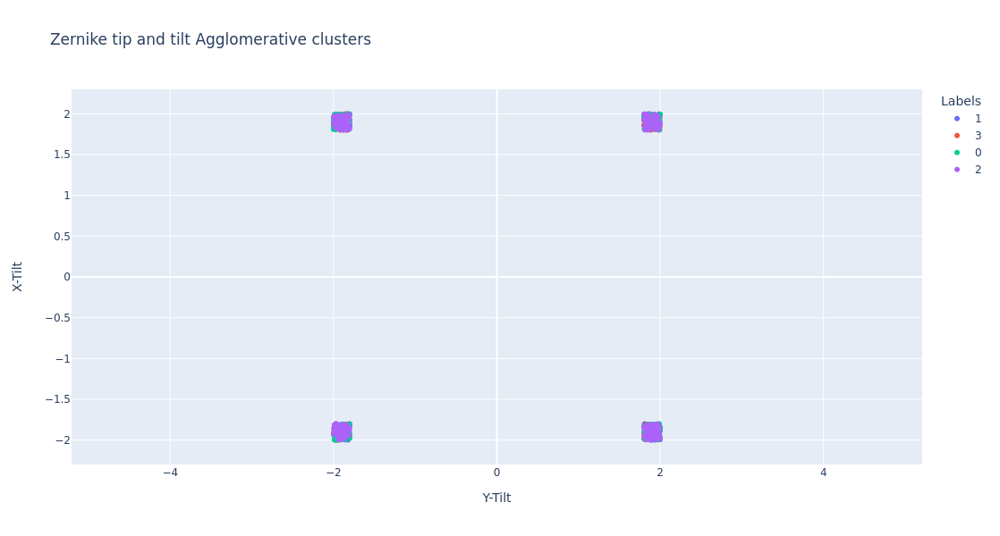

In [43]:
plot_clusters_from_labels(zernike_coefficients,
                          agglomerative_labels,
                          'Zernike tip and tilt Agglomerative clusters',
                          'Y-Tilt',
                          'X-Tilt',
                          'lpcoefficients',
                          'Agglomerative'
                          )

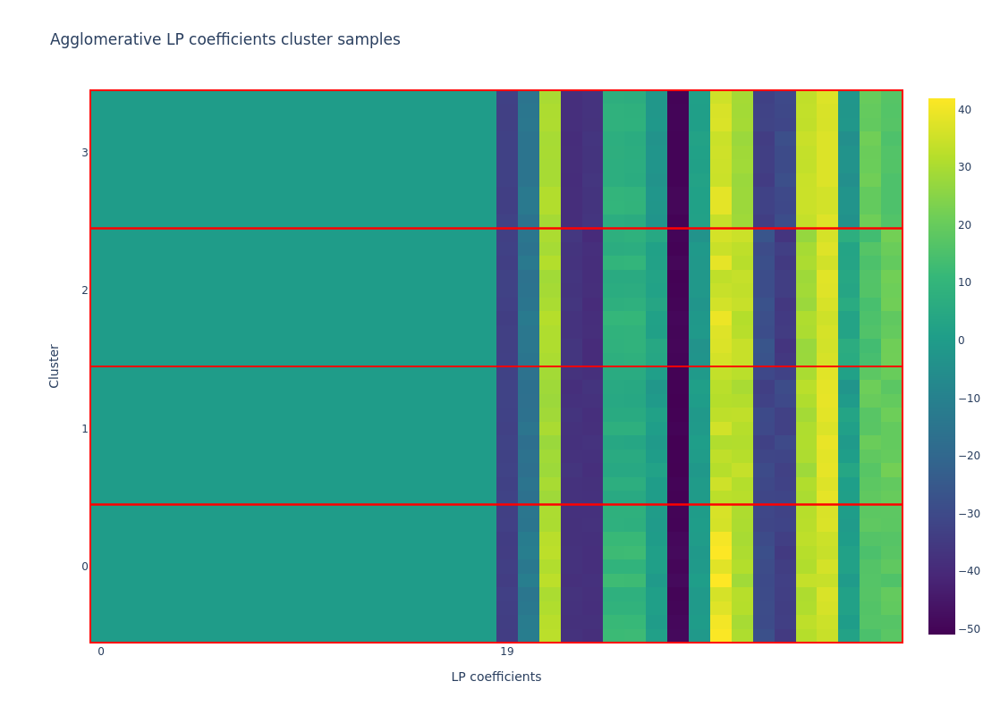

In [44]:
plot_grid_clusters(
    lp_coefficients,
    agglomerative_labels,
    [0,1,2,3],
    "Agglomerative LP coefficients cluster samples",
    "LP coefficients",
    "Cluster",
    19,
    'lpcoefficients',
    'Agglomerative'
    )

In [45]:
print(normalized_mutual_info_score(kmeans_labels, original_labels))
print(normalized_mutual_info_score(dbscan_labels, original_labels))
print(normalized_mutual_info_score(hdbscan_labels, original_labels))
print(normalized_mutual_info_score(agglomerative_labels, original_labels))
print()

print(normalized_mutual_info_score(dbscan_labels, kmeans_labels))
print(normalized_mutual_info_score(hdbscan_labels, kmeans_labels))
print(normalized_mutual_info_score(agglomerative_labels, kmeans_labels))

print()
print(normalized_mutual_info_score(hdbscan_labels, dbscan_labels))
print(normalized_mutual_info_score(agglomerative_labels, dbscan_labels))

print()
print(normalized_mutual_info_score(agglomerative_labels, original_labels))

0.002421191696886459
0.004031468723786528
0.00412099947689775
0.0022158796396466035

0.14625386128511528
0.1430889774535655
0.6958632807015429

0.175361646564758
0.1427298400560763

0.0022158796396466035


# Clustering PCA LP Coefficients

In [46]:
pca_lp_coefficients = np.load(minidataset_2m_dict['pca_lp_modes_path'])

The most repeated label is 2 with 257 occurrences.
The least repeated label is 1 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


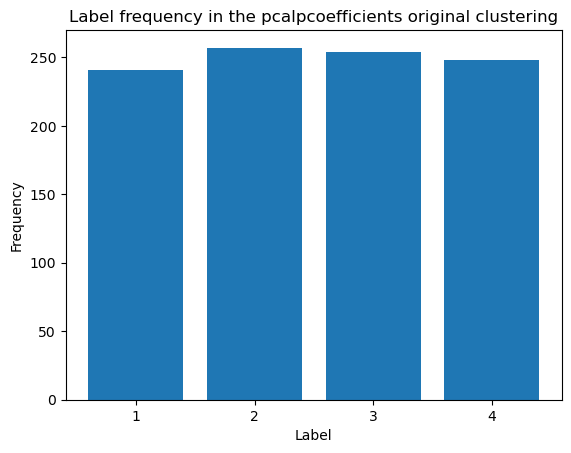

In [47]:
plot_cluster_labels_count(original_labels, 
                          'original',
                          'pcalpcoefficients')

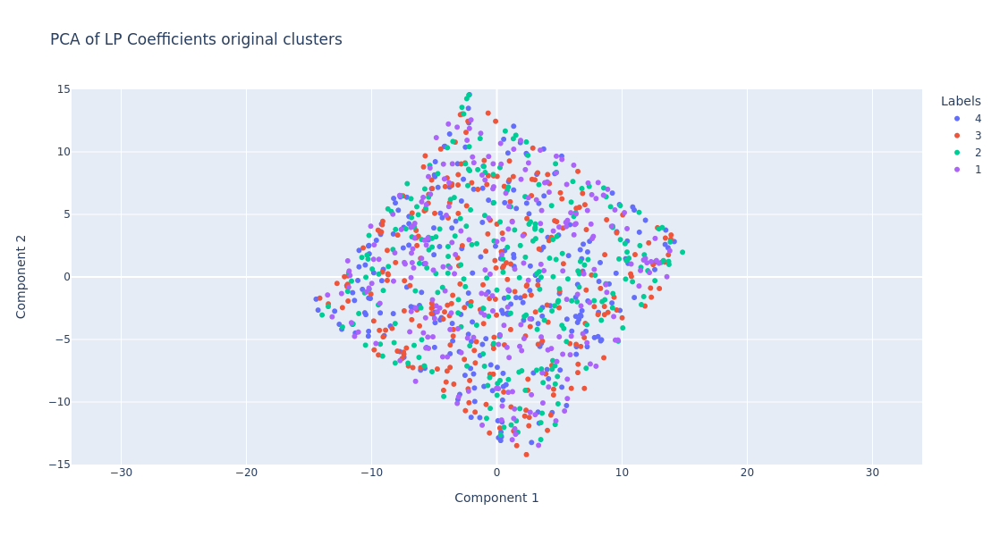

In [48]:
plot_clusters_from_labels(pca_lp_coefficients,
                          original_labels,
                          'PCA of LP Coefficients original clusters',
                          'Component 1',
                          'Component 2',
                          'pcalpcoefficients',
                          'original',
                          axis_range=[-15, 15])

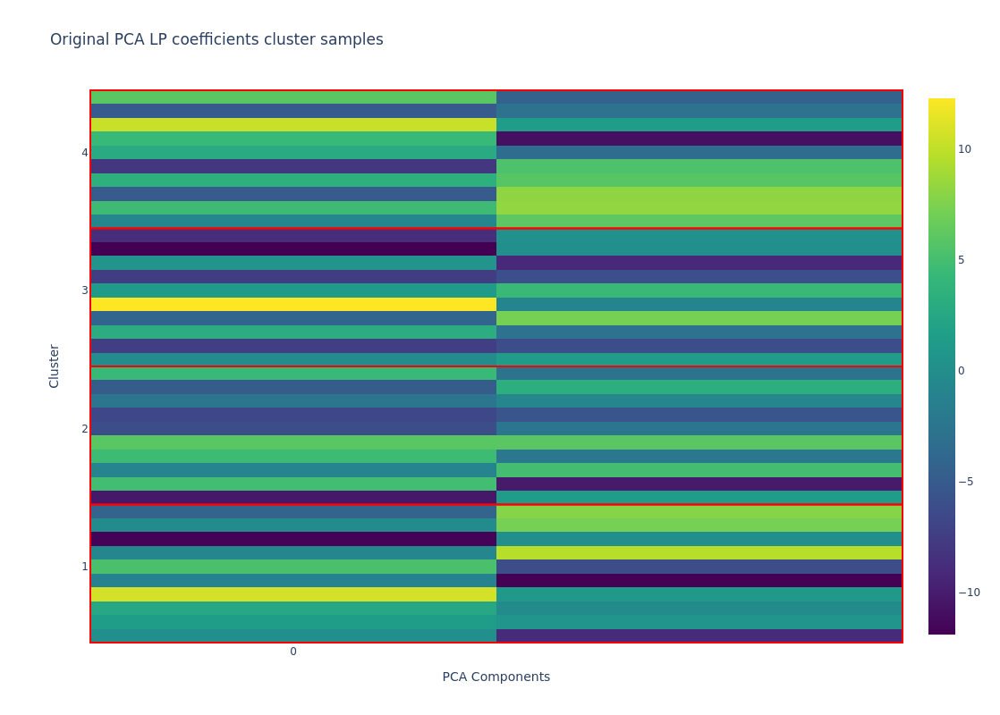

In [49]:
plot_grid_clusters(
    pca_lp_coefficients,
    original_labels,
    [1,2,3,4],
    "Original PCA LP coefficients cluster samples",
    "PCA Components",
    "Cluster",
    19,
    'pcalpcoefficients',
    'original'
    )

### K-Means

In [50]:
kmeans = KMeans(n_clusters=4,
                n_init=10)
kmeans_labels = kmeans.fit_predict(pca_lp_coefficients)

The most repeated label is 2 with 262 occurrences.
The least repeated label is 3 with 239 occurrence.
Cluster density mean: 250.0
Cluster density variance: 8.215838362577491


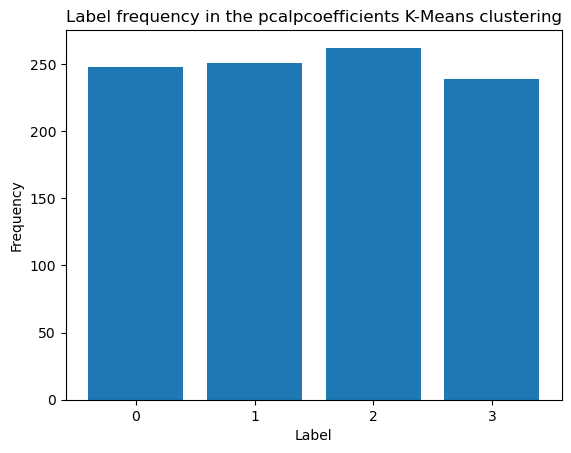

In [51]:
plot_cluster_labels_count(kmeans_labels, 
                          'K-Means',
                          'pcalpcoefficients')

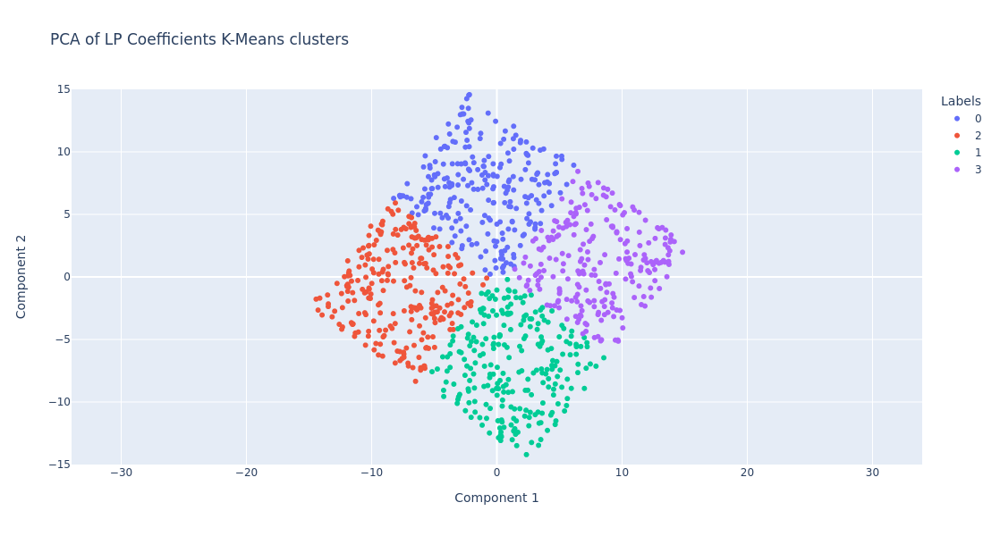

In [52]:
plot_clusters_from_labels(pca_lp_coefficients,
                          kmeans_labels,
                          'PCA of LP Coefficients K-Means clusters',
                          'Component 1',
                          'Component 2',
                          'pcalpcoefficients',
                          'K-Means',
                          axis_range=[-15, 15])

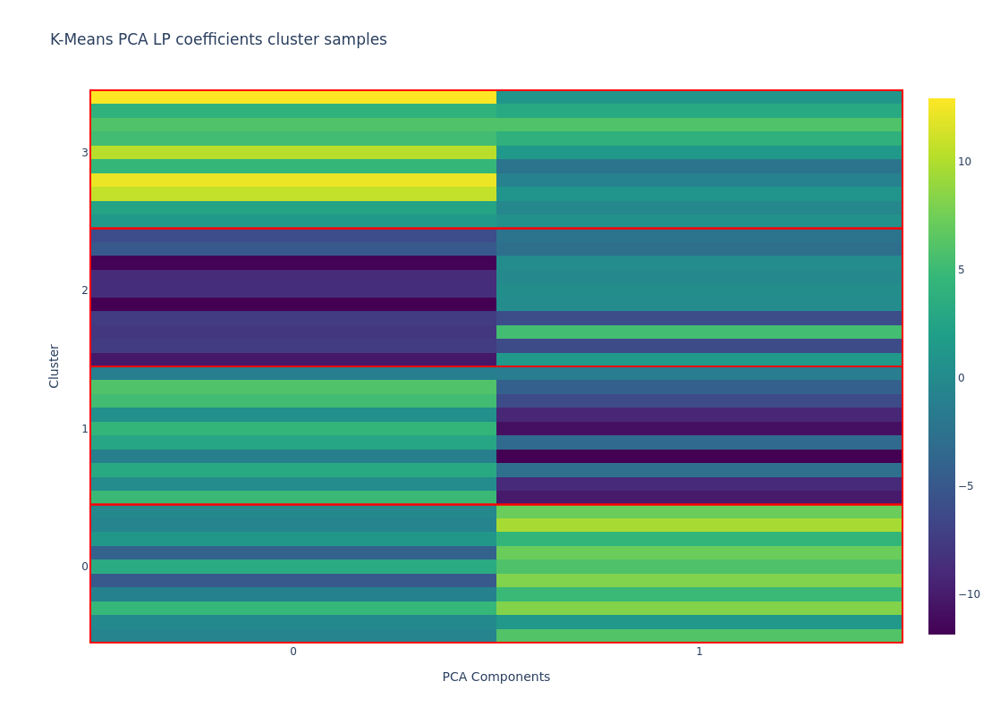

In [53]:
plot_grid_clusters(
    pca_lp_coefficients,
    kmeans_labels,
    [0,1,2,3],
    "K-Means PCA LP coefficients cluster samples",
    "PCA Components",
    "Cluster",
    1,
    'pcalpcoefficients',
    'K-Means'
    )

### DBSCAN

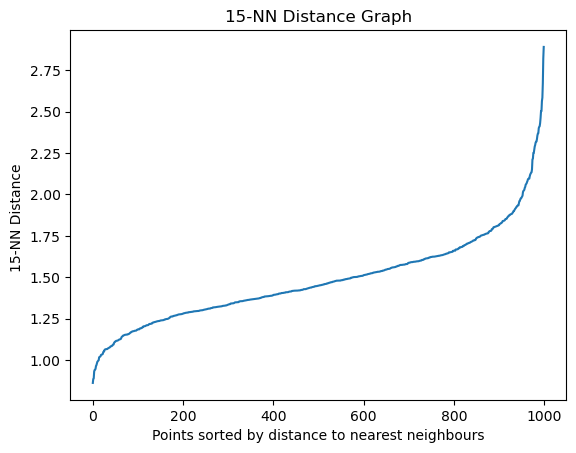

Number of clusters: 4
Numbers that are not noise: 953


In [54]:
n_neighbours = 15
plot_kneighbours(pca_lp_coefficients, n_neighbours)
epsilon = 1.52
dbscan_labels = get_number_of_clusters(pca_lp_coefficients, epsilon, n_neighbours)

The most repeated label is 0 with 864 occurrences.
The least repeated label is 2 with 14 occurrence.
Cluster density mean: 238.25
Cluster density variance: 361.7543192554859


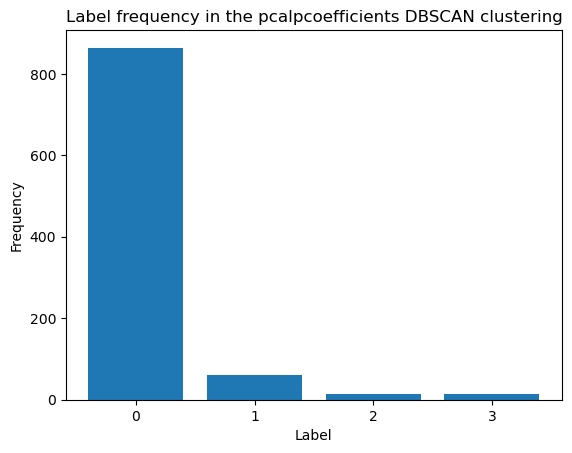

In [55]:
plot_cluster_labels_count(dbscan_labels, 'DBSCAN', 'pcalpcoefficients')

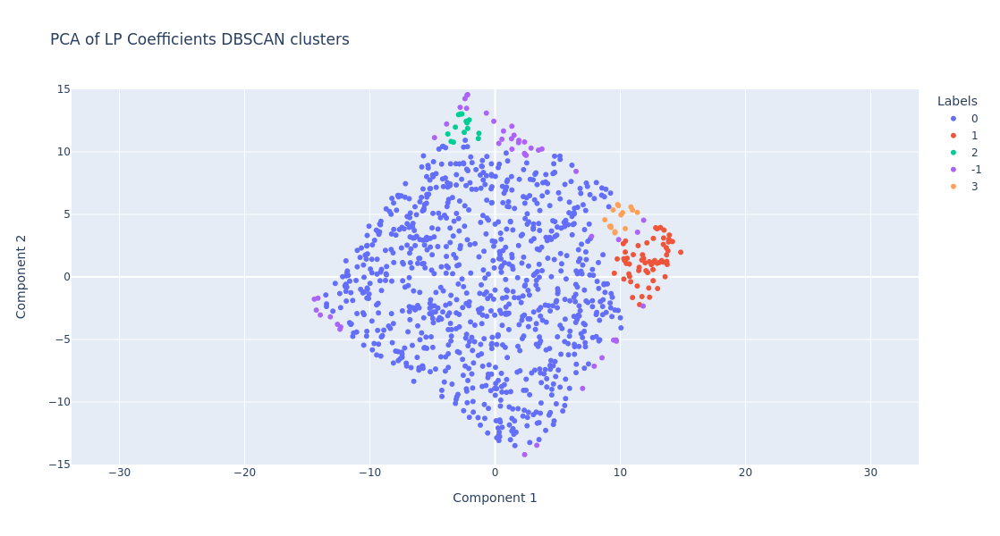

In [56]:
plot_clusters_from_labels(pca_lp_coefficients,
                          dbscan_labels,
                          'PCA of LP Coefficients DBSCAN clusters',
                          'Component 1',
                          'Component 2',
                          'pcalpcoefficients',
                          'DBSCAN',
                          axis_range=[-15, 15])

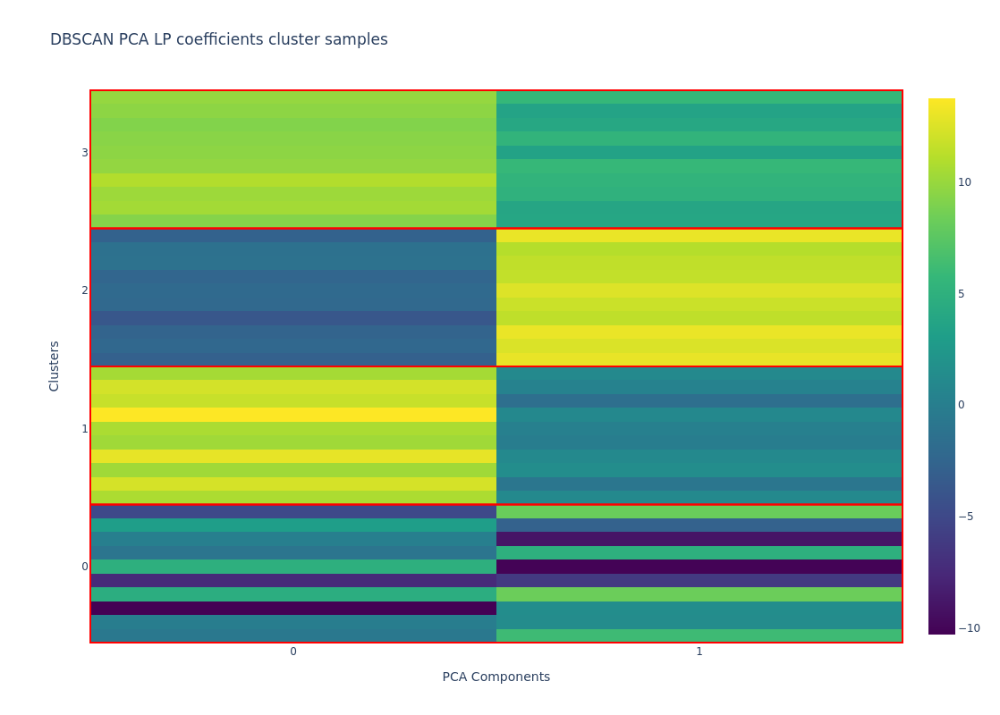

In [57]:
plot_grid_clusters(
    pca_lp_coefficients,
    dbscan_labels,
    [0,1,2,3],
    "DBSCAN PCA LP coefficients cluster samples",
    "PCA Components",
    "Clusters",
    1,
    'pcalpcoefficients',
    'DBSCAN'
    )

### HDBSCAN

In [58]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=21)
hdbscan_labels = clusterer.fit_predict(pca_lp_coefficients)

The most repeated label is 2 with 227 occurrences.
The least repeated label is 3 with 28 occurrence.
Cluster density mean: 126.25
Cluster density variance: 91.17942476238814


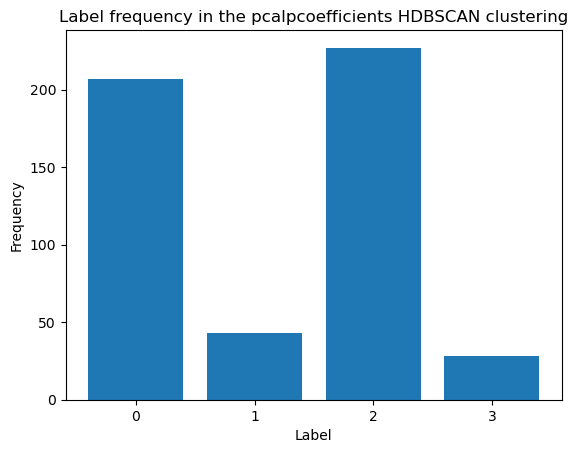

In [59]:
plot_cluster_labels_count(hdbscan_labels, 'HDBSCAN', 'pcalpcoefficients')

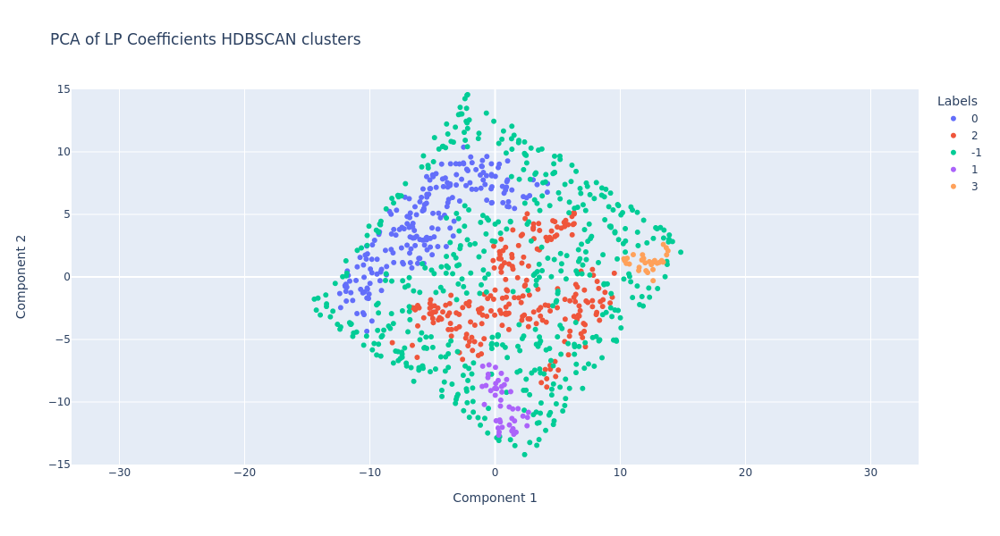

In [60]:
plot_clusters_from_labels(pca_lp_coefficients,
                          hdbscan_labels,
                          'PCA of LP Coefficients HDBSCAN clusters',
                          'Component 1',
                          'Component 2',
                          'pcalpcoefficients',
                          'HDBSCAN',
                          axis_range=[-15, 15]
                          )

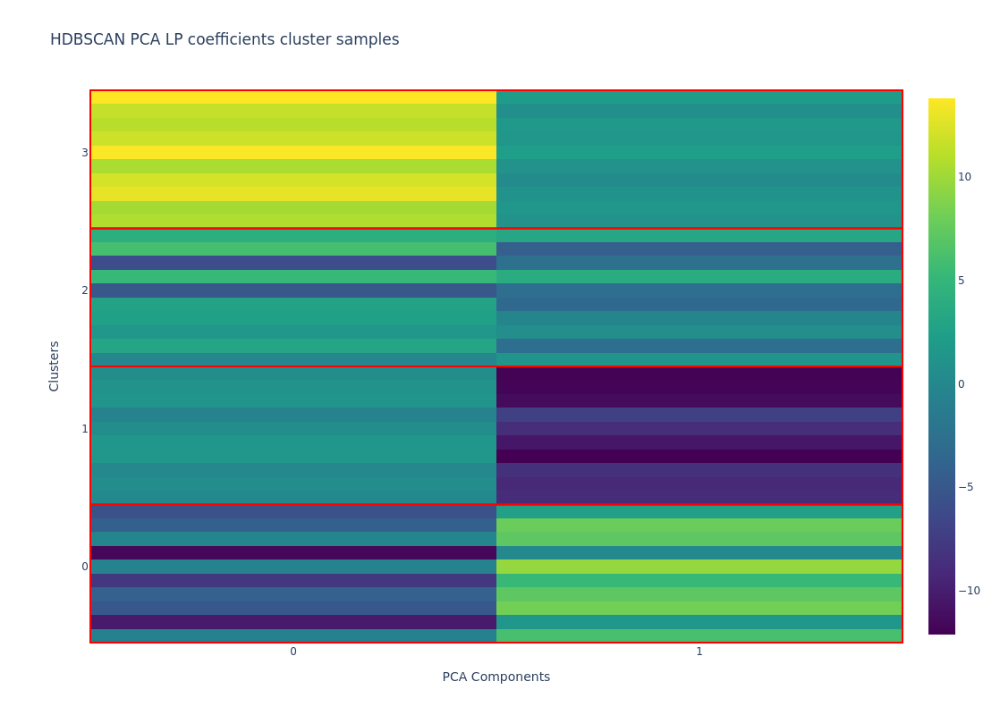

In [61]:
plot_grid_clusters(
    pca_lp_coefficients,
    hdbscan_labels,
    [0,1,2,3],
    "HDBSCAN PCA LP coefficients cluster samples",
    "PCA Components",
    "Clusters",
    1,
    'pcalpcoefficients',
    'HDBSCAN'
    )

### Agglomerative clustering

In [62]:
agglomerativeclustering = AgglomerativeClustering(n_clusters=4)
agglomerative_labels = agglomerativeclustering.fit_predict(pca_lp_coefficients)

The most repeated label is 0 with 382 occurrences.
The least repeated label is 3 with 154 occurrence.
Cluster density mean: 250.0
Cluster density variance: 85.63877626402656


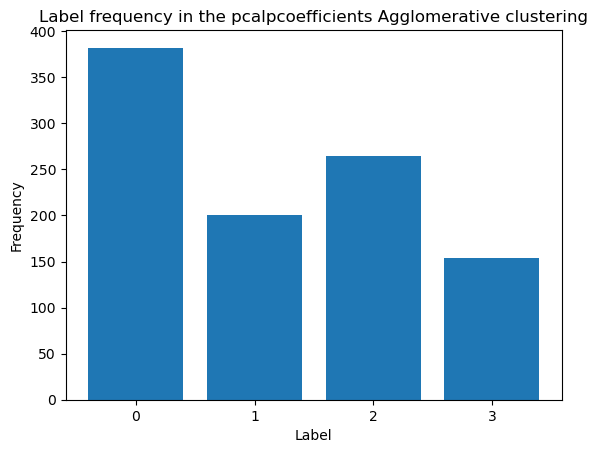

In [63]:
plot_cluster_labels_count(agglomerative_labels, 
                          'Agglomerative',
                         'pcalpcoefficients')

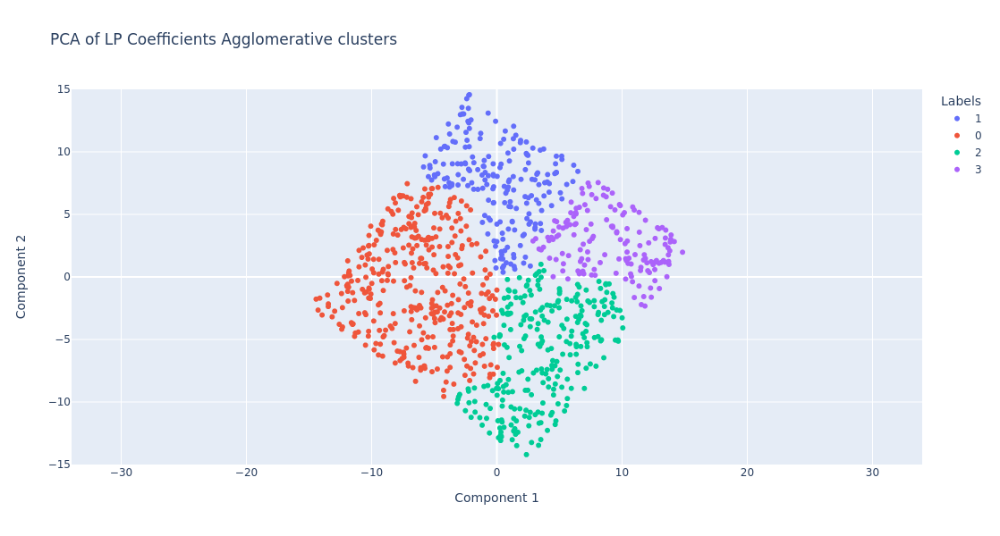

In [64]:
plot_clusters_from_labels(pca_lp_coefficients,
                          agglomerative_labels,
                          'PCA of LP Coefficients Agglomerative clusters',
                          'Component 1',
                          'Component 2',
                          'pcalpcoefficients',
                          'Agglomerative',
                          axis_range=[-15, 15])

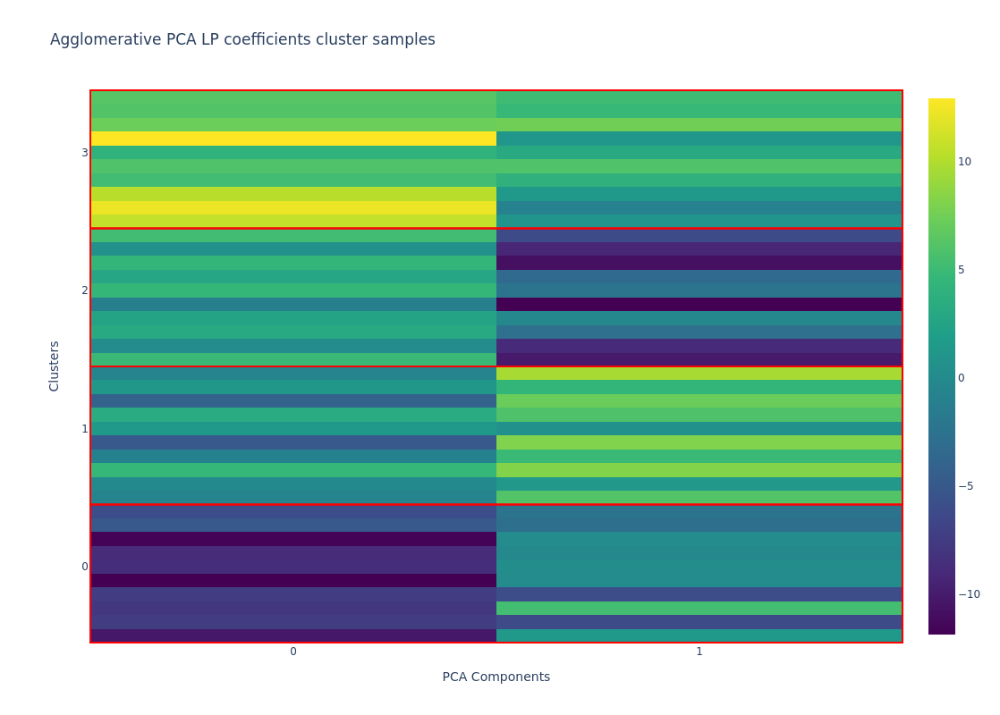

In [65]:
plot_grid_clusters(
    pca_lp_coefficients,
    agglomerative_labels,
    [0,1,2,3],
    "Agglomerative PCA LP coefficients cluster samples",
    "PCA Components",
    "Clusters",
    1,
    'pcalpcoefficients',
    'Agglomerative'
    )

In [66]:
print(normalized_mutual_info_score(kmeans_labels, original_labels))
print(normalized_mutual_info_score(dbscan_labels, original_labels))
print(normalized_mutual_info_score(hdbscan_labels, original_labels))
print(normalized_mutual_info_score(agglomerative_labels, original_labels))
print()

print(normalized_mutual_info_score(dbscan_labels, kmeans_labels))
print(normalized_mutual_info_score(hdbscan_labels, kmeans_labels))
print(normalized_mutual_info_score(agglomerative_labels, kmeans_labels))

print()
print(normalized_mutual_info_score(hdbscan_labels, dbscan_labels))
print(normalized_mutual_info_score(agglomerative_labels, dbscan_labels))

print()
print(normalized_mutual_info_score(agglomerative_labels, original_labels))

0.002421191696886459
0.0039059328722469778
0.0032104776324466218
0.003178949346458999

0.15077313378955887
0.1986884239632213
0.6424783632759499

0.17894618935529216
0.2094791318273126

0.003178949346458999


# Clustering UMAP LP Coefficients

In [67]:
umap_lp_coefficients = np.load(minidataset_2m_dict['umap_lp_modes_path'])

The most repeated label is 2 with 257 occurrences.
The least repeated label is 1 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


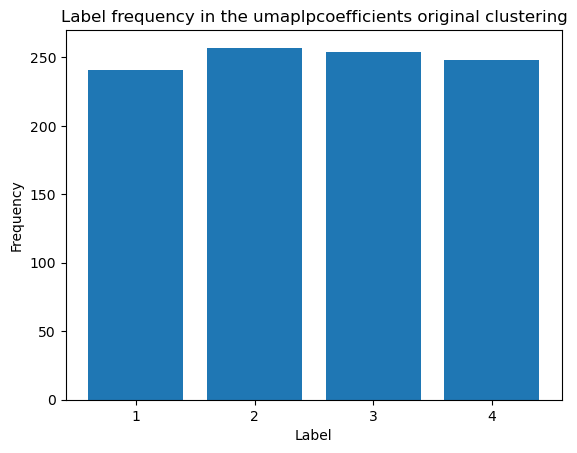

In [68]:
plot_cluster_labels_count(original_labels, 
                          'original',
                          'umaplpcoefficients')

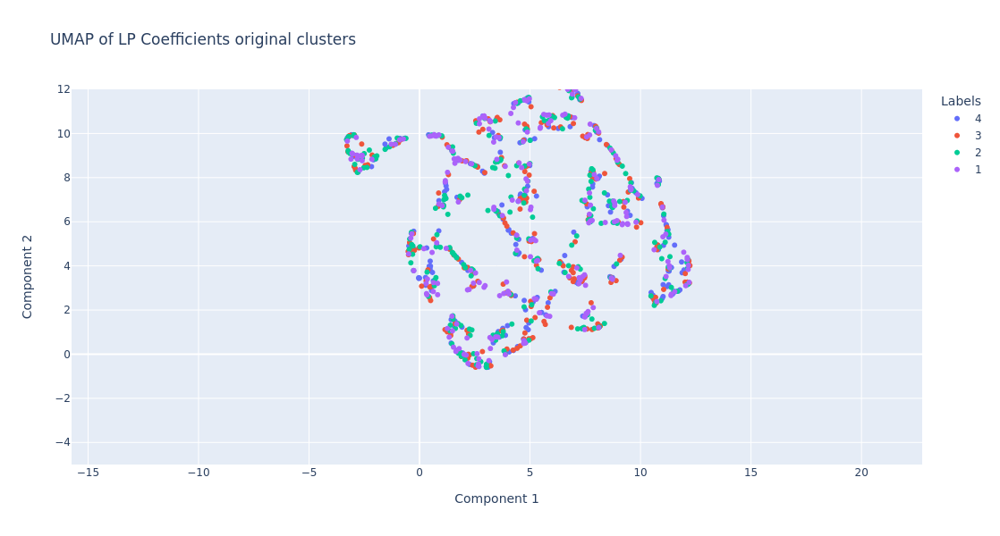

In [69]:
plot_clusters_from_labels(umap_lp_coefficients,
                          original_labels,
                          'UMAP of LP Coefficients original clusters',
                          'Component 1',
                          'Component 2',
                          'umaplpcoefficients',
                          'original',
                          axis_range=[-5, 12])

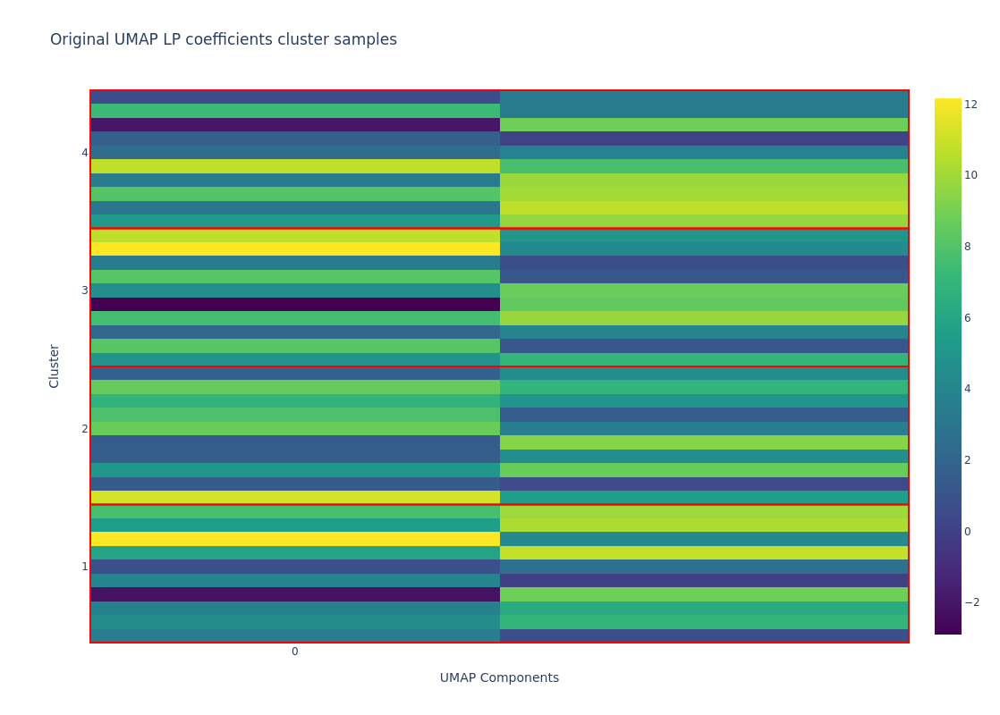

In [70]:
plot_grid_clusters(
    umap_lp_coefficients,
    original_labels,
    [1,2,3,4],
    "Original UMAP LP coefficients cluster samples",
    "UMAP Components",
    "Cluster",
    19,
    'umaplpcoefficients',
    'original'
    )

### K-Means

In [71]:
kmeans = KMeans(n_clusters=4,
                n_init=10)
kmeans_labels = kmeans.fit_predict(umap_lp_coefficients)

The most repeated label is 0 with 286 occurrences.
The least repeated label is 3 with 175 occurrence.
Cluster density mean: 250.0
Cluster density variance: 44.06245567373657


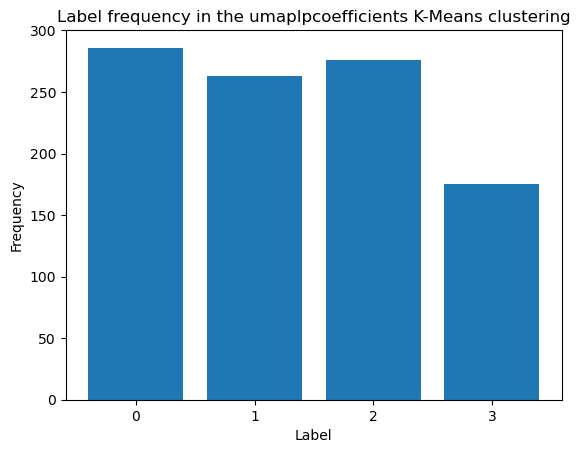

In [72]:
plot_cluster_labels_count(kmeans_labels, 
                          'K-Means',
                          'umaplpcoefficients')

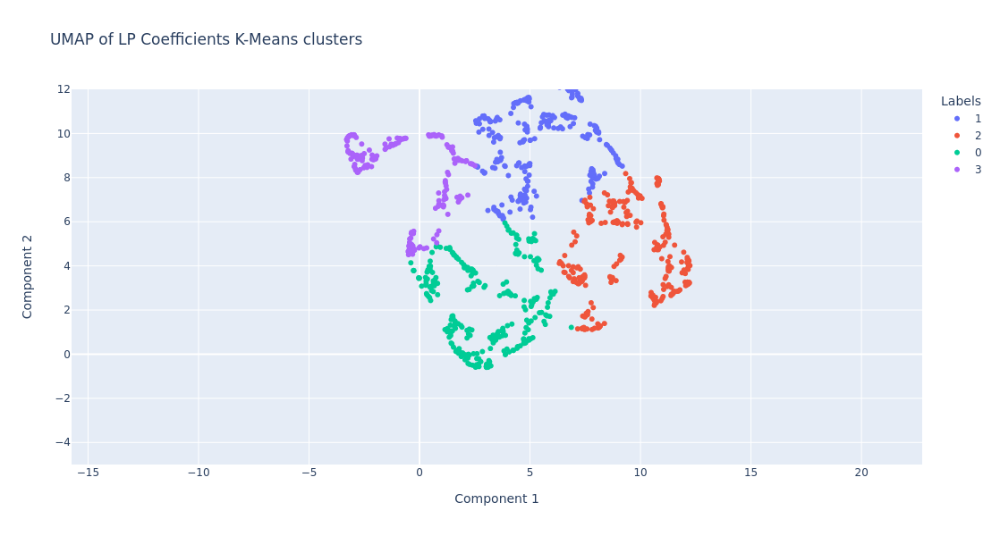

In [73]:
plot_clusters_from_labels(umap_lp_coefficients,
                          kmeans_labels,
                          'UMAP of LP Coefficients K-Means clusters',
                          'Component 1',
                          'Component 2',
                          'umaplpcoefficients',
                          'K-Means',
                          axis_range=[-5, 12])

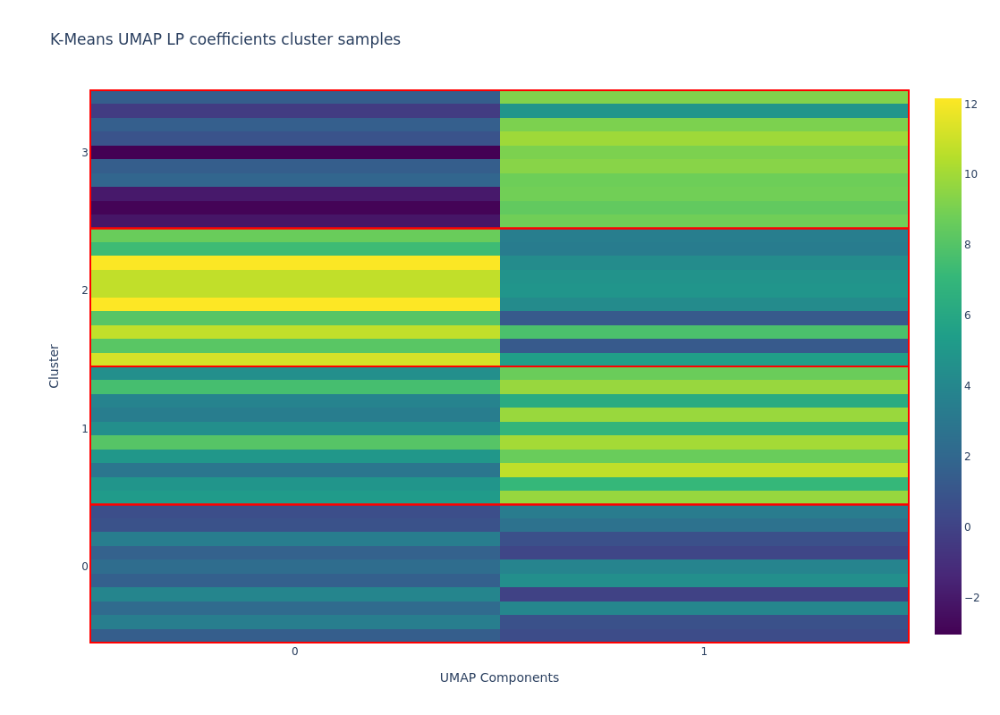

In [74]:
plot_grid_clusters(
    umap_lp_coefficients,
    kmeans_labels,
    [0,1,2,3],
    "K-Means UMAP LP coefficients cluster samples",
    "UMAP Components",
    "Cluster",
    1,
    'umaplpcoefficients',
    'K-Means'
    )

### DBSCAN

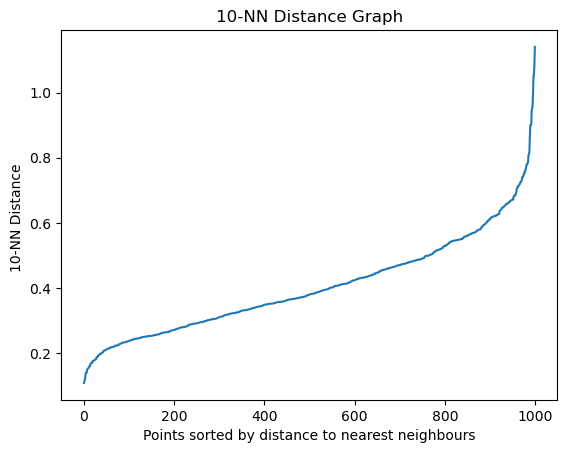

Number of clusters: 6
Numbers that are not noise: 1000


In [75]:
n_neighbours = 10
plot_kneighbours(umap_lp_coefficients, n_neighbours)
epsilon = 0.85
dbscan_labels = get_number_of_clusters(umap_lp_coefficients, epsilon, n_neighbours)

The most repeated label is 0 with 439 occurrences.
The least repeated label is 5 with 16 occurrence.
Cluster density mean: 166.66666666666666
Cluster density variance: 146.5033181270043


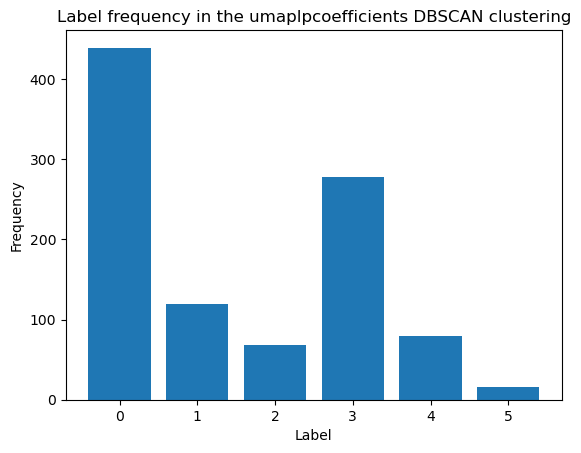

In [76]:
plot_cluster_labels_count(dbscan_labels, 
                          'DBSCAN', 
                          'umaplpcoefficients')

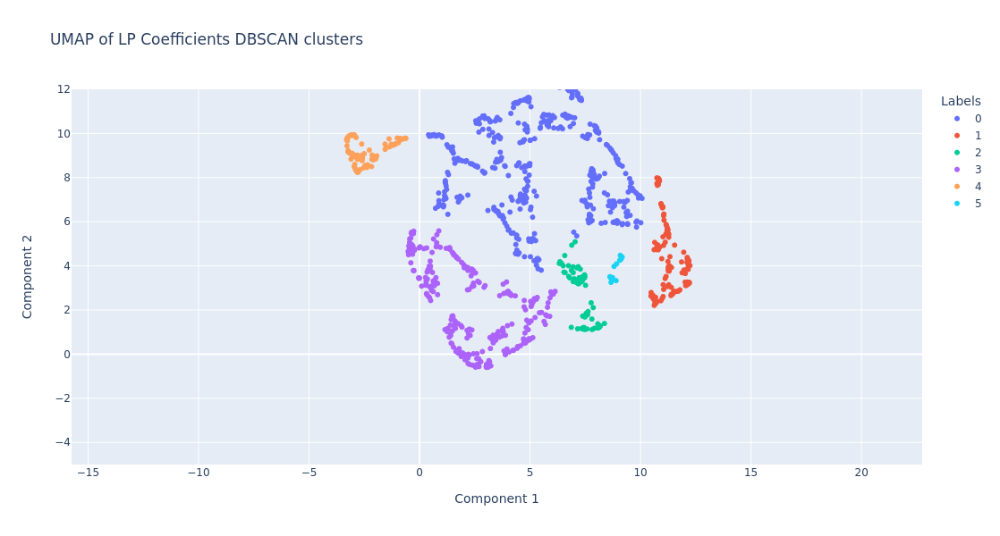

In [77]:
plot_clusters_from_labels(umap_lp_coefficients,
                          dbscan_labels,
                          'UMAP of LP Coefficients DBSCAN clusters',
                          'Component 1',
                          'Component 2',
                          'umaplpcoefficients',
                          'DBSCAN',
                          axis_range=[-5, 12])

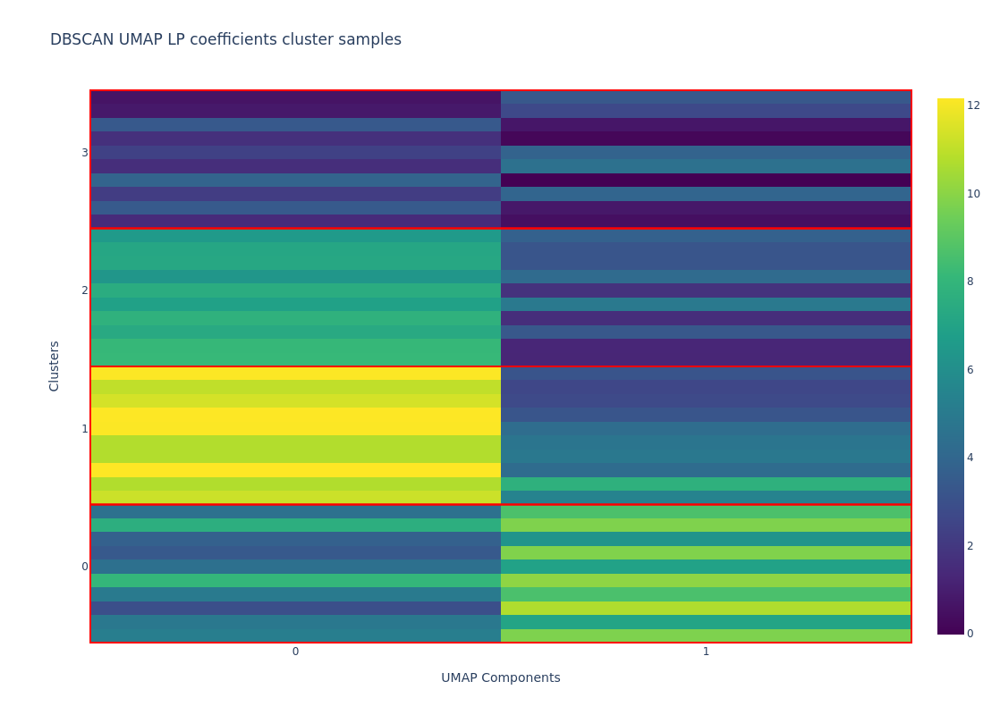

In [78]:
plot_grid_clusters(
    umap_lp_coefficients,
    dbscan_labels,
    [0,1,2,3],
    "DBSCAN UMAP LP coefficients cluster samples",
    "UMAP Components",
    "Clusters",
    1,
    'umaplpcoefficients',
    'DBSCAN'
    )

### HDBSCAN

In [79]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=25)
hdbscan_labels = clusterer.fit_predict(umap_lp_coefficients)

The most repeated label is 4 with 144 occurrences.
The least repeated label is 7 with 29 occurrence.
Cluster density mean: 83.0
Cluster density variance: 38.1051177665153


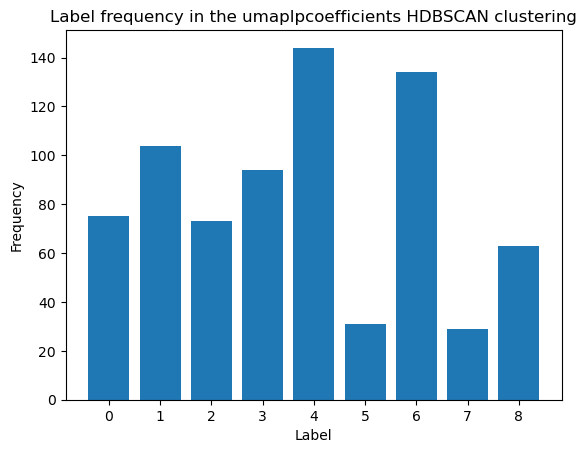

In [80]:
plot_cluster_labels_count(hdbscan_labels, 'HDBSCAN', 'umaplpcoefficients')

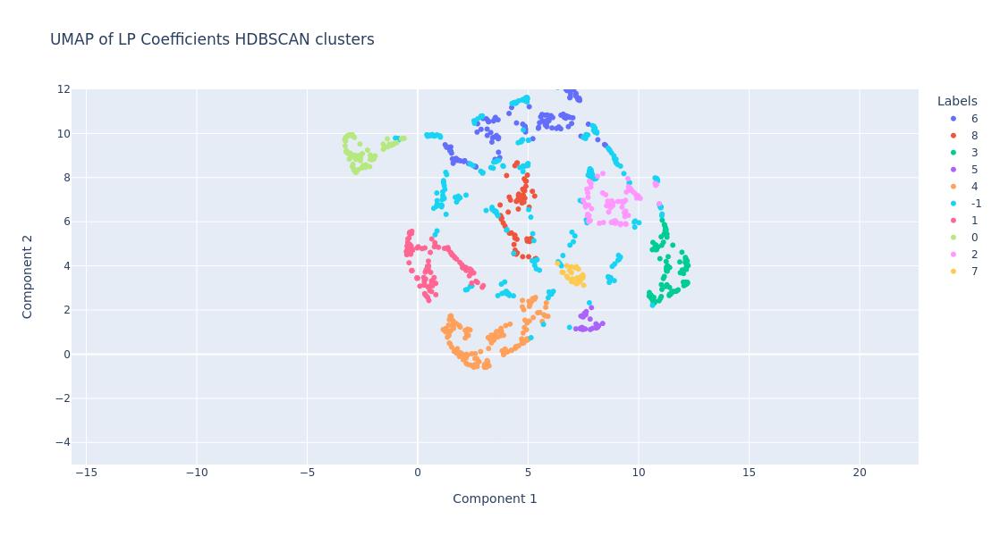

In [81]:
plot_clusters_from_labels(umap_lp_coefficients,
                          hdbscan_labels,
                          'UMAP of LP Coefficients HDBSCAN clusters',
                          'Component 1',
                          'Component 2',
                          'umaplpcoefficients',
                          'HDBSCAN',
                          axis_range=[-5, 12]
                          )

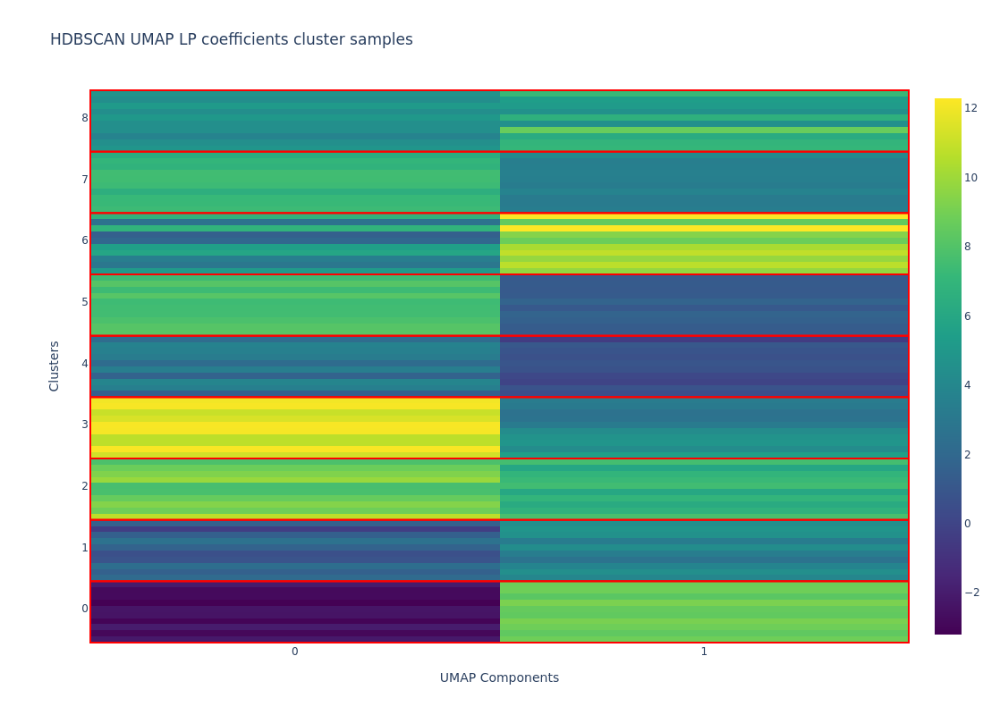

In [82]:
plot_grid_clusters(
    umap_lp_coefficients,
    hdbscan_labels,
    [0,1,2,3,4,5,6,7,8,9],
    "HDBSCAN UMAP LP coefficients cluster samples",
    "UMAP Components",
    "Clusters",
    1,
    'umaplpcoefficients',
    'HDBSCAN'
    )

### Agglomerative clustering

In [83]:
agglomerativeclustering = AgglomerativeClustering(n_clusters=4)
agglomerative_labels = agglomerativeclustering.fit_predict(umap_lp_coefficients)

The most repeated label is 0 with 346 occurrences.
The least repeated label is 3 with 80 occurrence.
Cluster density mean: 250.0
Cluster density variance: 101.26203632161463


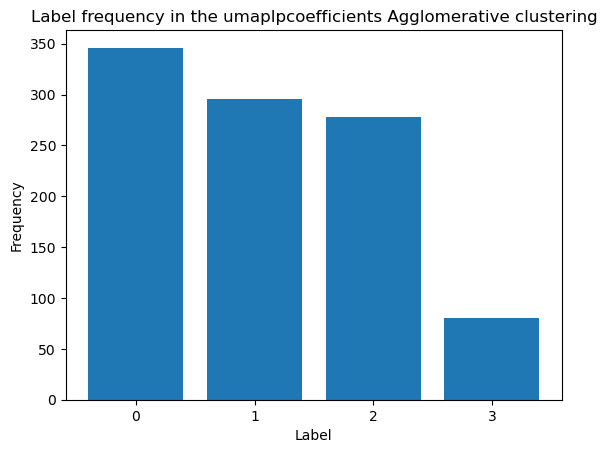

In [84]:
plot_cluster_labels_count(agglomerative_labels, 
                          'Agglomerative',
                         'umaplpcoefficients')

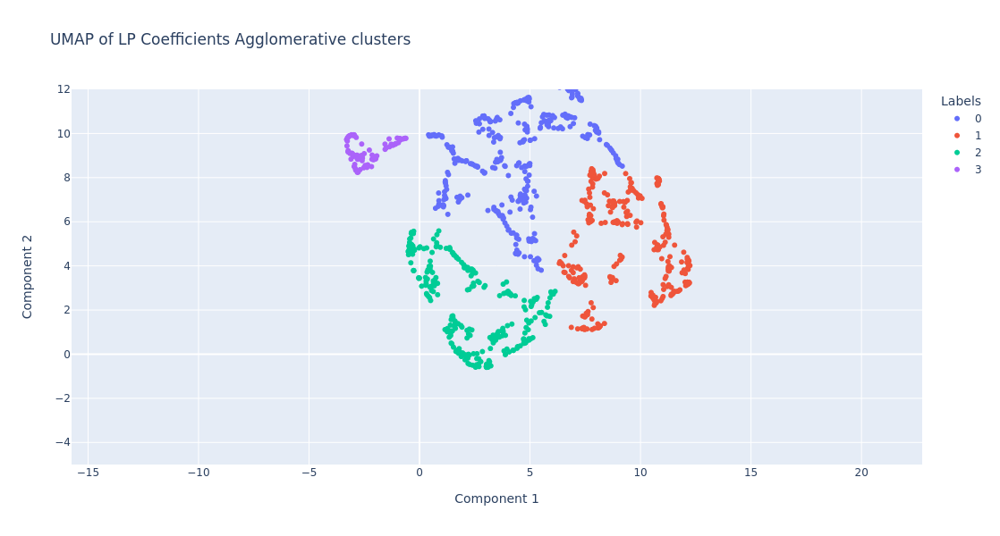

In [85]:
plot_clusters_from_labels(umap_lp_coefficients,
                          agglomerative_labels,
                          'UMAP of LP Coefficients Agglomerative clusters',
                          'Component 1',
                          'Component 2',
                          'umaplpcoefficients',
                          'Agglomerative',
                          axis_range=[-5, 12])

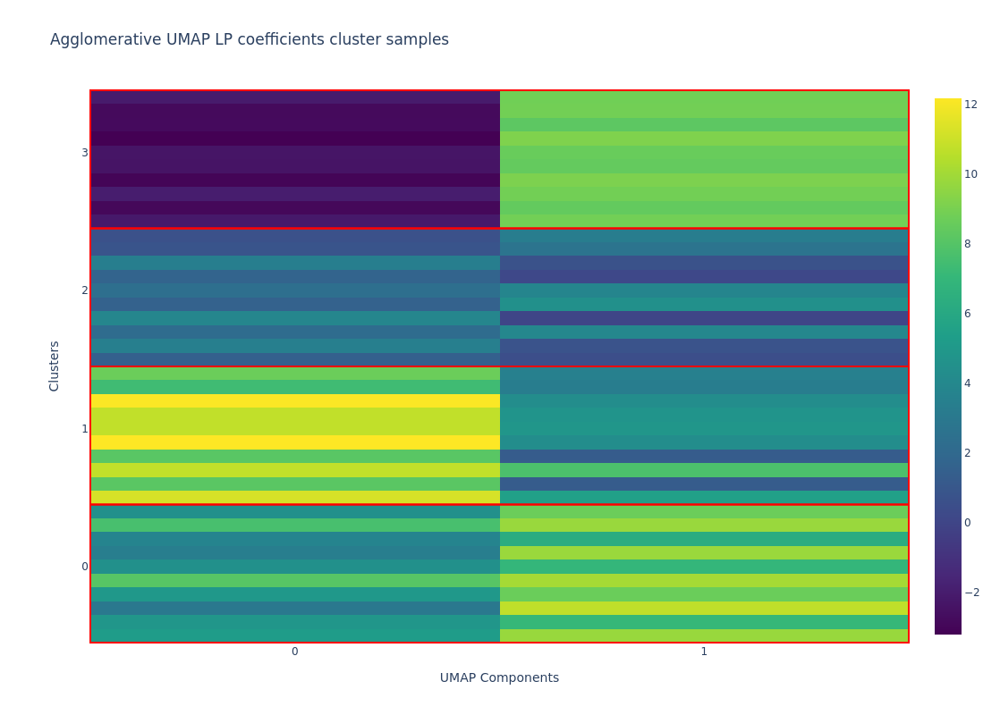

In [86]:
plot_grid_clusters(
    umap_lp_coefficients,
    agglomerative_labels,
    [0,1,2,3],
    "Agglomerative UMAP LP coefficients cluster samples",
    "UMAP Components",
    "Clusters",
    1,
    'umaplpcoefficients',
    'Agglomerative'
    )

In [87]:
print(normalized_mutual_info_score(kmeans_labels, original_labels))
print(normalized_mutual_info_score(dbscan_labels, original_labels))
print(normalized_mutual_info_score(hdbscan_labels, original_labels))
print(normalized_mutual_info_score(agglomerative_labels, original_labels))
print()

print(normalized_mutual_info_score(dbscan_labels, kmeans_labels))
print(normalized_mutual_info_score(hdbscan_labels, kmeans_labels))
print(normalized_mutual_info_score(agglomerative_labels, kmeans_labels))

print()
print(normalized_mutual_info_score(hdbscan_labels, dbscan_labels))
print(normalized_mutual_info_score(agglomerative_labels, dbscan_labels))

print()
print(normalized_mutual_info_score(agglomerative_labels, original_labels))

0.003030590400761115
0.006634253606980179
0.008020624145803484
0.002344908185361688

0.5639797059120373
0.4880156681527555
0.6935290035448007

0.6386647991147362
0.7822381050540513

0.002344908185361688


# Clustering Output fluxes

In [88]:
output_fluxes = np.load(minidataset_2m_dict['output_fluxes'])

The most repeated label is 2 with 257 occurrences.
The least repeated label is 1 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


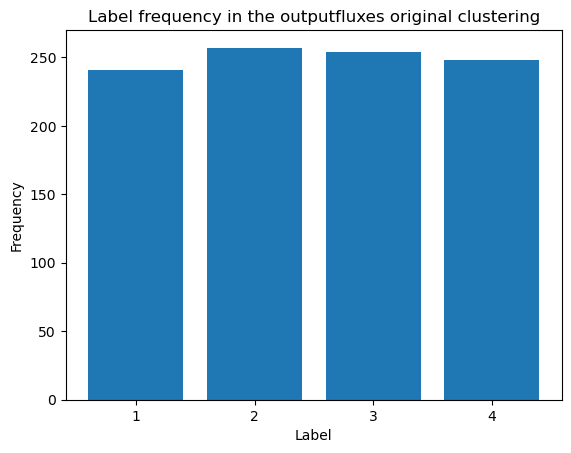

In [89]:
plot_cluster_labels_count(original_labels, 
                          'original',
                          'outputfluxes')

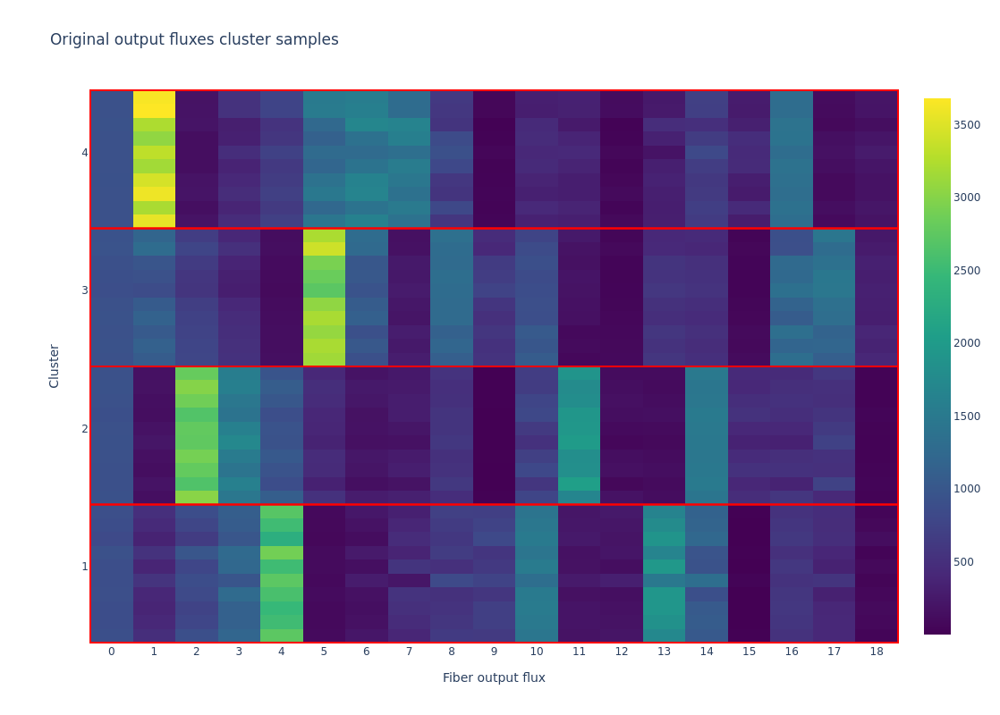

In [90]:
plot_grid_clusters(
    output_fluxes,
    original_labels,
    [1,2,3,4],
    "Original output fluxes cluster samples",
    "Fiber output flux",
    "Cluster",
    1,
    'outputfluxes',
    'original'
    )

### K-Means

In [91]:
kmeans = KMeans(n_clusters=4,
                n_init=100)
kmeans_labels = kmeans.fit_predict(output_fluxes)

The most repeated label is 0 with 257 occurrences.
The least repeated label is 2 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


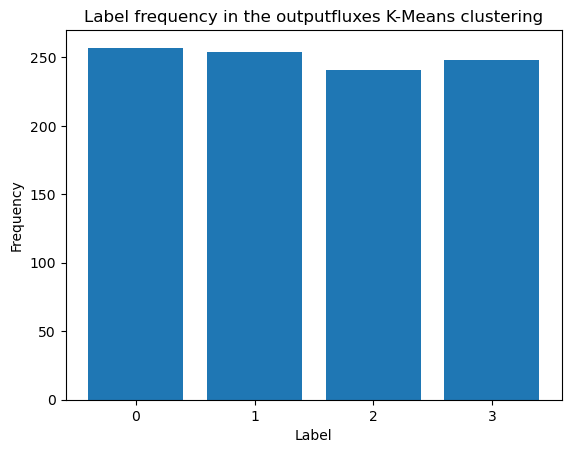

In [92]:
plot_cluster_labels_count(kmeans_labels, 
                          'K-Means',
                          'outputfluxes')

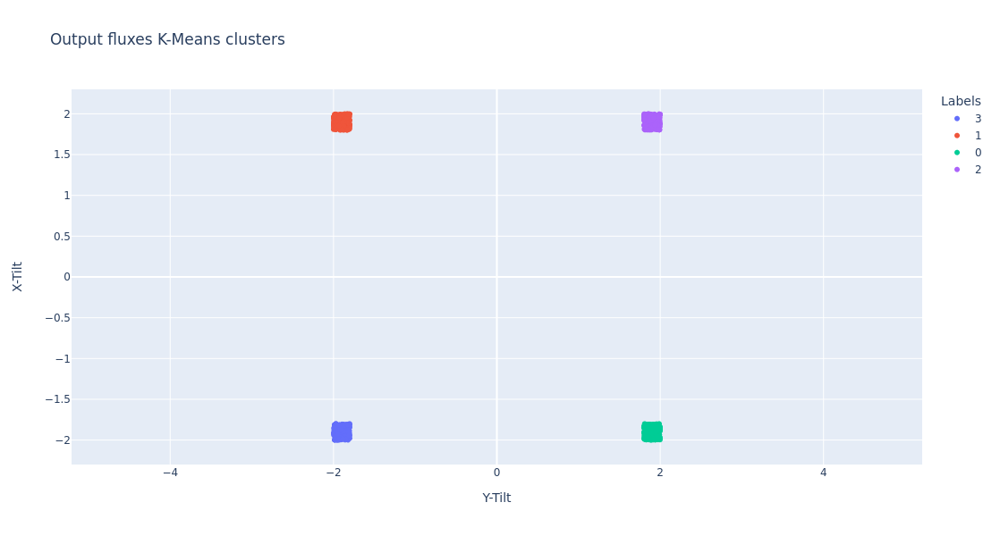

In [93]:
plot_clusters_from_labels(zernike_coefficients,
                          kmeans_labels,
                          'Output fluxes K-Means clusters',
                          'Y-Tilt',
                          'X-Tilt',
                          'outputfluxes',
                          'K-Means')

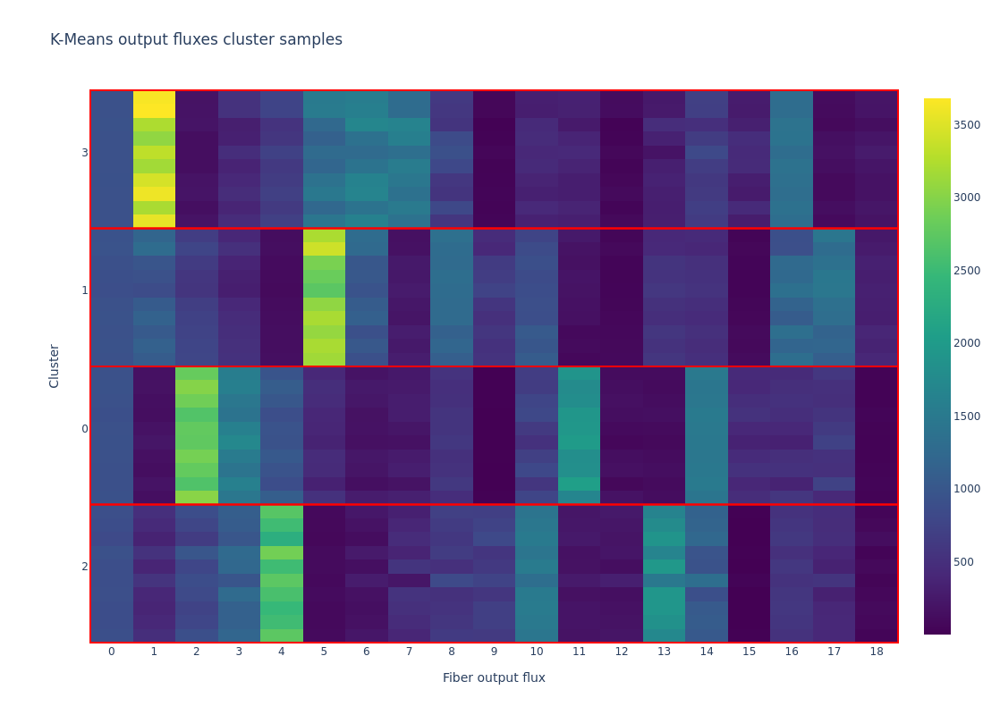

In [94]:
plot_grid_clusters(
    output_fluxes,
    kmeans_labels,
    [2,0,1,3],
    "K-Means output fluxes cluster samples",
    "Fiber output flux",
    "Cluster",
    1,
    'outputfluxes',
    'K-Means'
    )

### DBSCAN

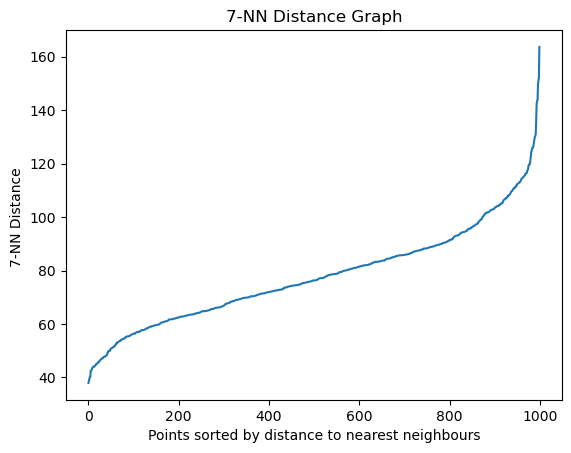

Number of clusters: 4
Numbers that are not noise: 1000


In [95]:
n_neighbours = 7
plot_kneighbours(output_fluxes, n_neighbours)
epsilon = 120
dbscan_labels = get_number_of_clusters(output_fluxes, epsilon, n_neighbours)

The most repeated label is 2 with 257 occurrences.
The least repeated label is 3 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


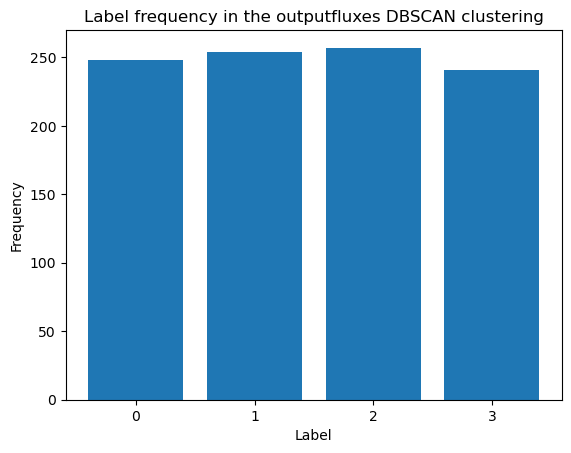

In [96]:
plot_cluster_labels_count(dbscan_labels, 'DBSCAN', 'outputfluxes')

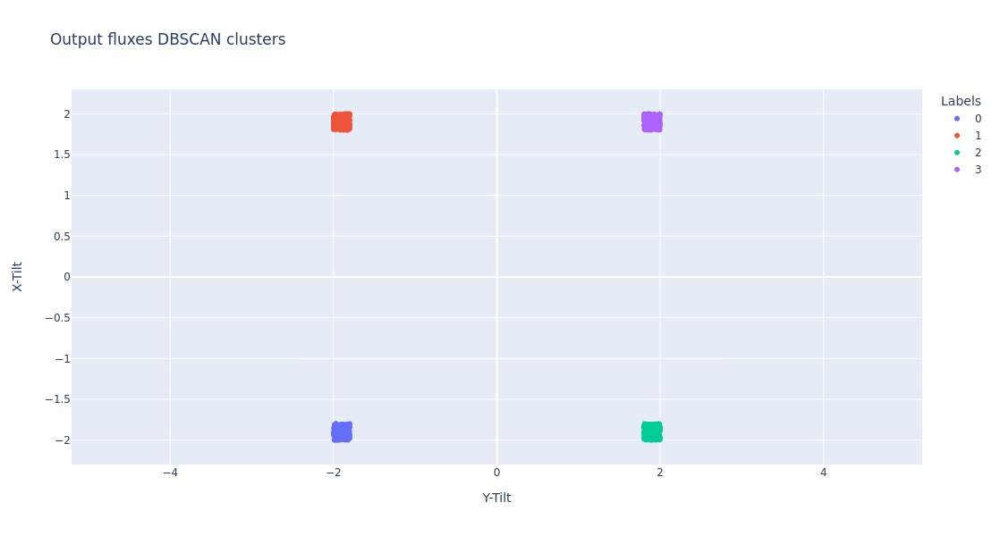

In [97]:
plot_clusters_from_labels(zernike_coefficients,
                          dbscan_labels,
                          'Output fluxes DBSCAN clusters',
                          'Y-Tilt',
                          'X-Tilt',
                          'outputfluxes',
                          'DBSCAN')

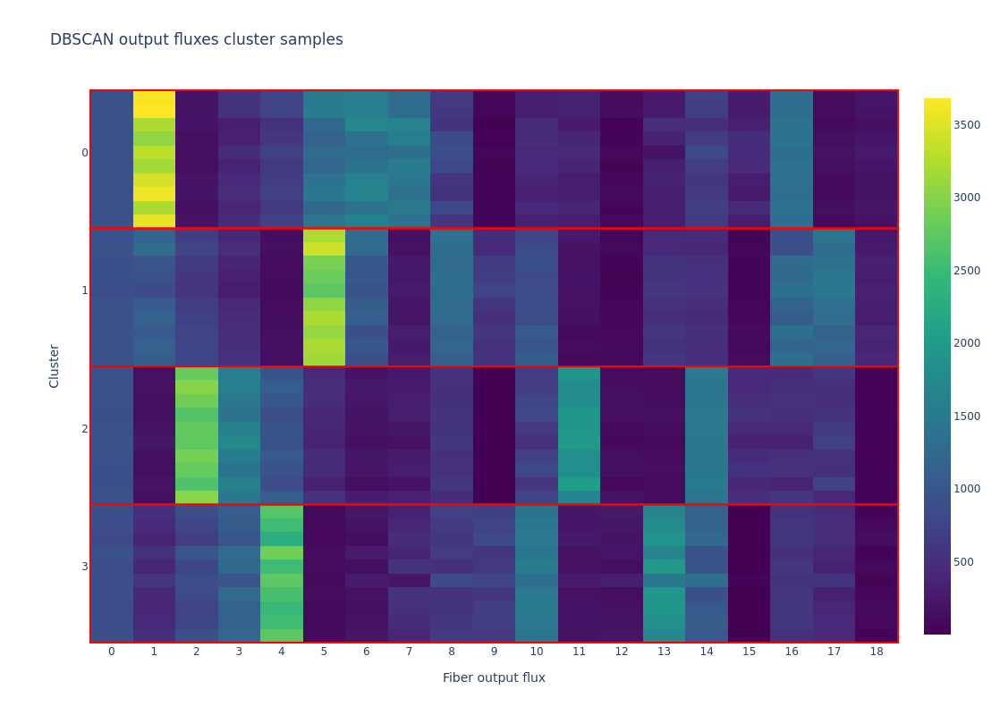

In [98]:
plot_grid_clusters(
    output_fluxes,
    dbscan_labels,
    [3,2,1,0],
    "DBSCAN output fluxes cluster samples",
    "Fiber output flux",
    "Cluster",
    1,
    'outputfluxes',
    'DBSCAN'
    )

### HDBSCAN

In [99]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=21)
hdbscan_labels = clusterer.fit_predict(output_fluxes)

The most repeated label is 0 with 257 occurrences.
The least repeated label is 1 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


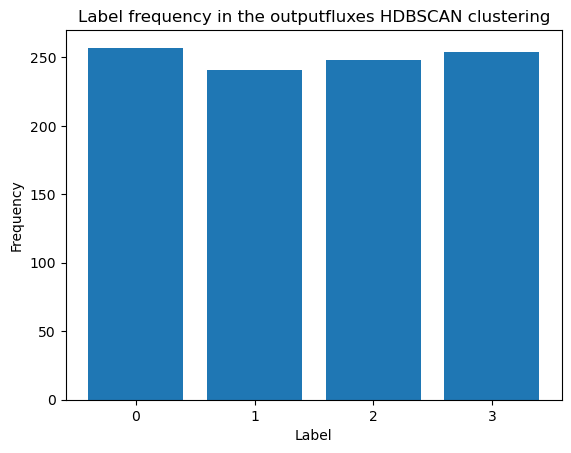

In [100]:
plot_cluster_labels_count(hdbscan_labels, 'HDBSCAN', 'outputfluxes')

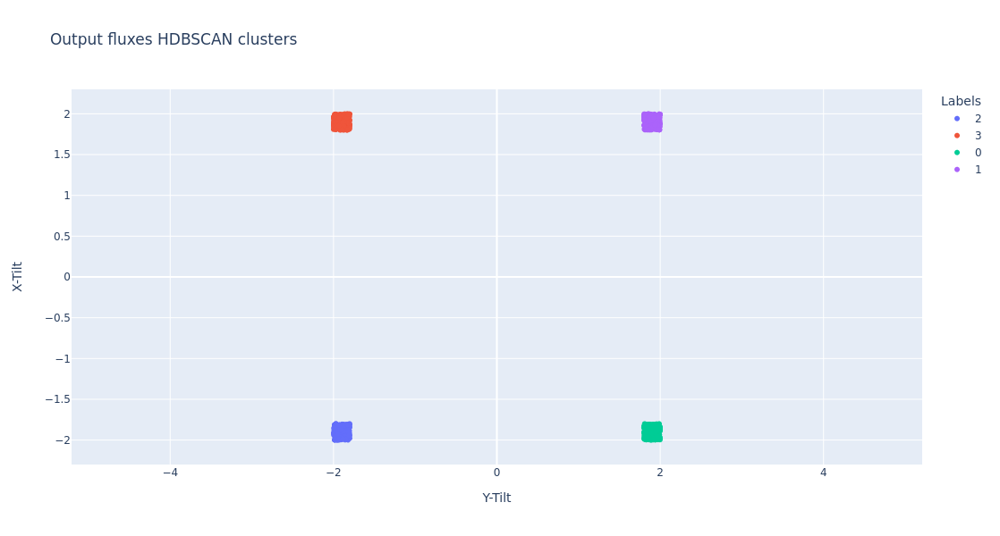

In [101]:
plot_clusters_from_labels(zernike_coefficients,
                          hdbscan_labels,
                          'Output fluxes HDBSCAN clusters',
                          'Y-Tilt',
                          'X-Tilt',
                          'outputfluxes',
                          'HDBSCAN'
                          )

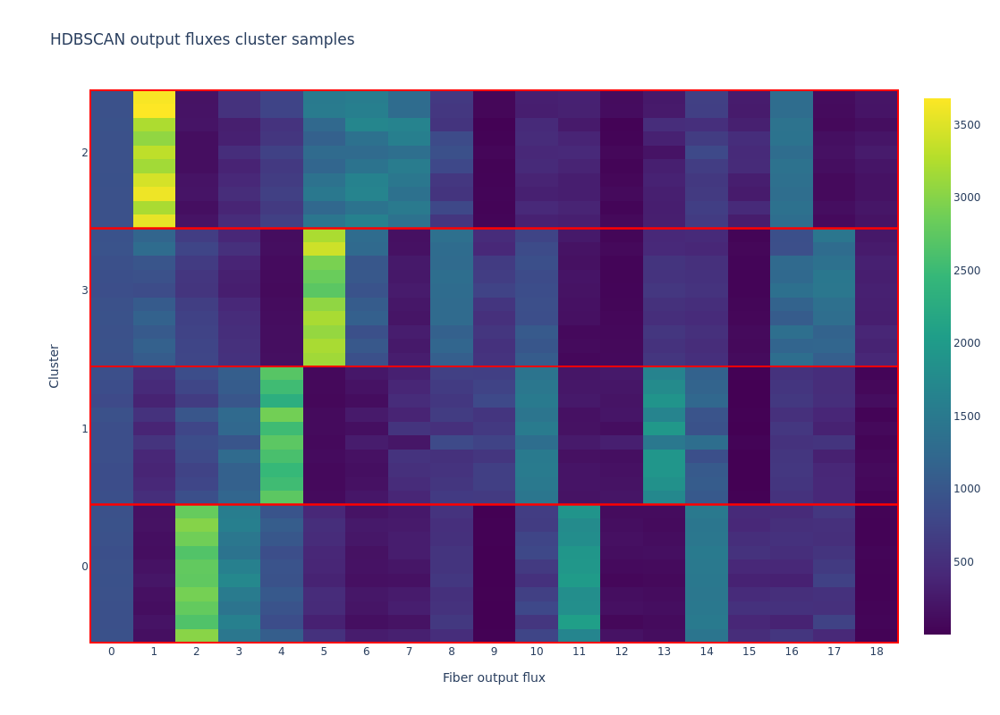

In [102]:
plot_grid_clusters(
    output_fluxes,
    hdbscan_labels,
    [0,1,3,2],
    "HDBSCAN output fluxes cluster samples",
    "Fiber output flux",
    "Cluster",
    1,
    'outputfluxes',
    'HDBSCAN'
    )

### Agglomerative clustering

In [103]:
agglomerativeclustering = AgglomerativeClustering(n_clusters=4)
agglomerative_labels = agglomerativeclustering.fit_predict(output_fluxes)

The most repeated label is 1 with 257 occurrences.
The least repeated label is 2 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


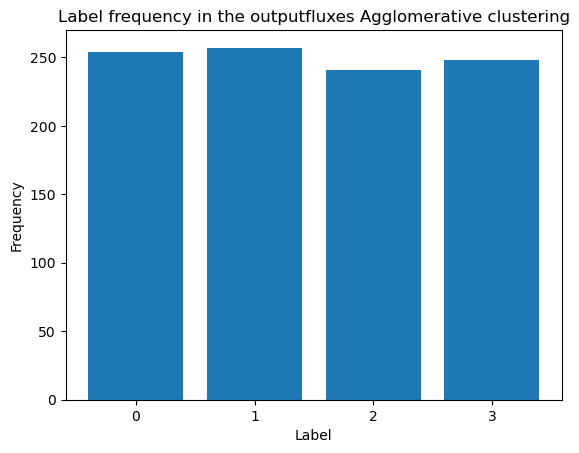

In [104]:
plot_cluster_labels_count(agglomerative_labels, 
                          'Agglomerative',
                         'outputfluxes')

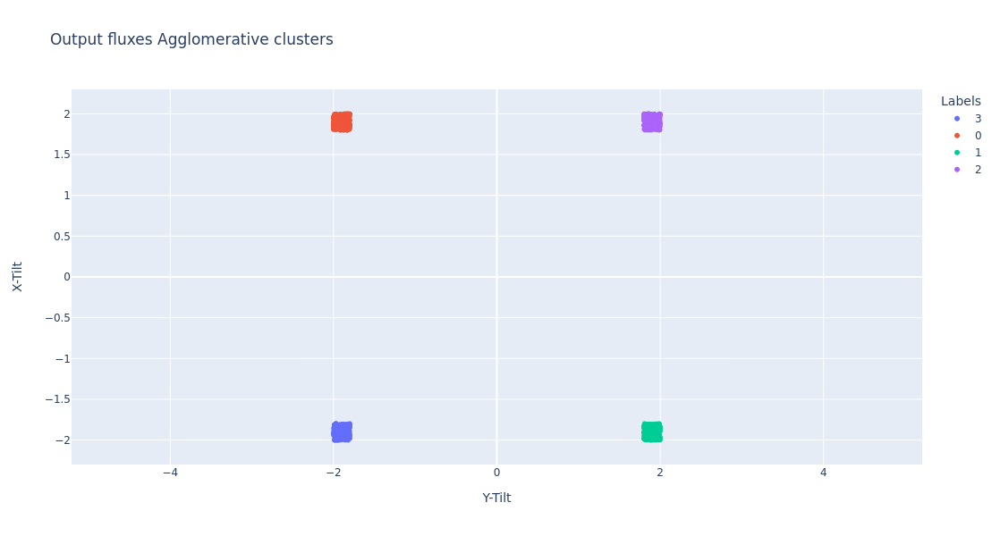

In [105]:
plot_clusters_from_labels(zernike_coefficients,
                          agglomerative_labels,
                          'Output fluxes Agglomerative clusters',
                          'Y-Tilt',
                          'X-Tilt',
                          'outputfluxes',
                          'Agglomerative'
                          )

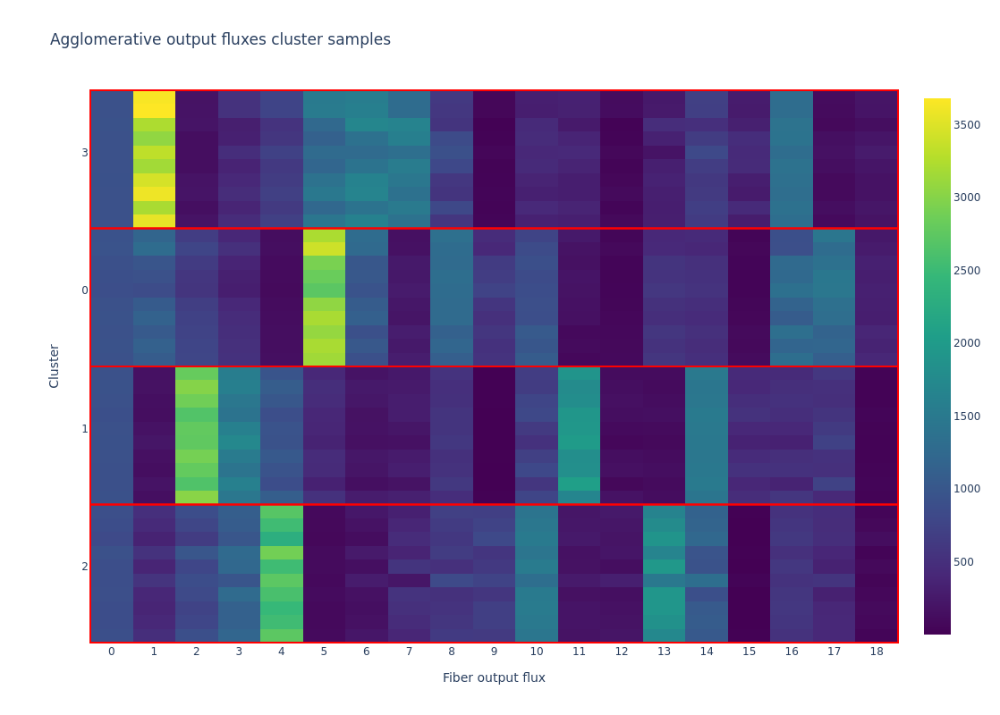

In [106]:
plot_grid_clusters(
    output_fluxes,
    agglomerative_labels,
    [2,1,0,3],
    "Agglomerative output fluxes cluster samples",
    "Fiber output flux",
    "Cluster",
    1,
    'outputfluxes',
    'Agglomerative'
    )

In [107]:
print(normalized_mutual_info_score(kmeans_labels, original_labels))
print(normalized_mutual_info_score(dbscan_labels, original_labels))
print(normalized_mutual_info_score(hdbscan_labels, original_labels))
print(normalized_mutual_info_score(agglomerative_labels, original_labels))
print()

print(normalized_mutual_info_score(dbscan_labels, kmeans_labels))
print(normalized_mutual_info_score(hdbscan_labels, kmeans_labels))
print(normalized_mutual_info_score(agglomerative_labels, kmeans_labels))

print()
print(normalized_mutual_info_score(hdbscan_labels, dbscan_labels))
print(normalized_mutual_info_score(agglomerative_labels, dbscan_labels))

print()
print(normalized_mutual_info_score(agglomerative_labels, original_labels))

1.0
1.0
1.0
1.0

1.0
1.0
1.0

1.0
1.0

1.0


# Clustering PCA Output fluxes

In [108]:
pca_output_fluxes = np.load(minidataset_2m_dict['pca_output_fluxes_path'])

The most repeated label is 2 with 257 occurrences.
The least repeated label is 1 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


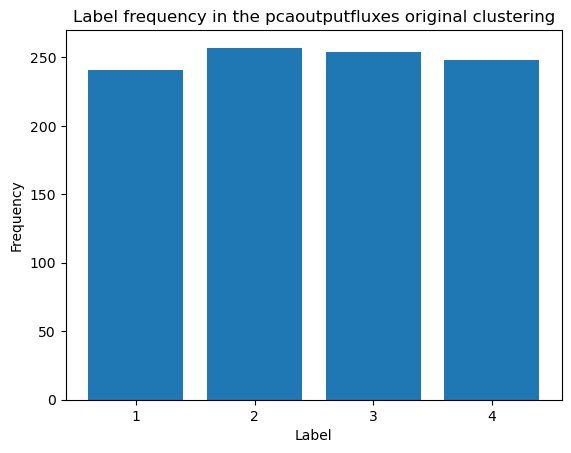

In [109]:
plot_cluster_labels_count(original_labels, 
                          'original',
                          'pcaoutputfluxes')

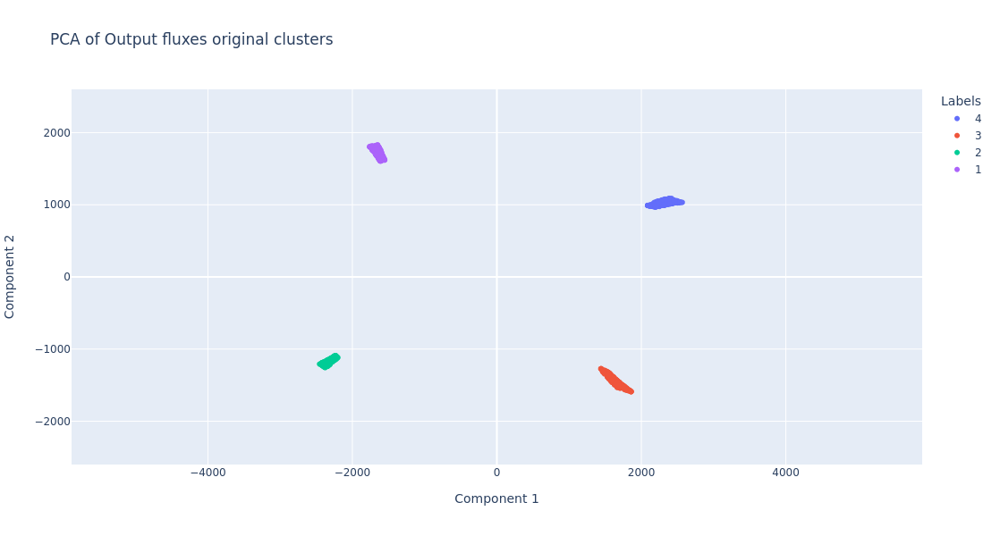

In [110]:
plot_clusters_from_labels(pca_output_fluxes,
                          original_labels,
                          'PCA of Output fluxes original clusters',
                          'Component 1',
                          'Component 2',
                          'pcaoutputfluxes',
                          'original',
                          axis_range=[-2600, 2600])

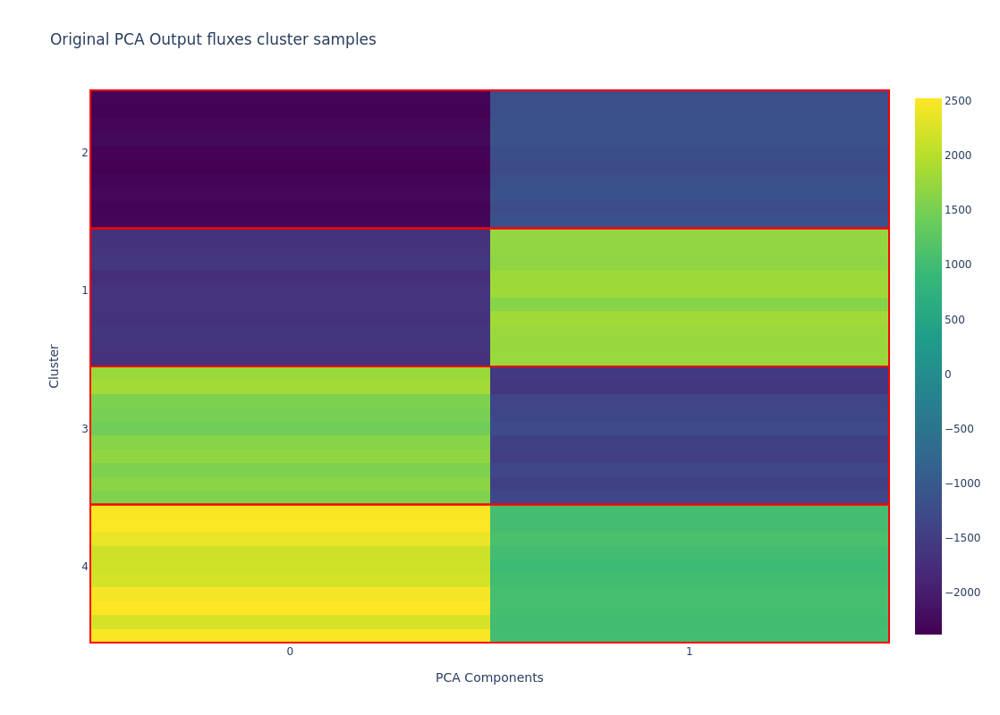

In [111]:
plot_grid_clusters(
    pca_output_fluxes,
    original_labels,
    [4,3,1,2],
    "Original PCA Output fluxes cluster samples",
    "PCA Components",
    "Cluster",
    1,
    'pcaoutputfluxes',
    'original'
    )

### K-Means

In [112]:
kmeans = KMeans(n_clusters=4,
                n_init=10)
kmeans_labels = kmeans.fit_predict(pca_output_fluxes)

The most repeated label is 2 with 257 occurrences.
The least repeated label is 0 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


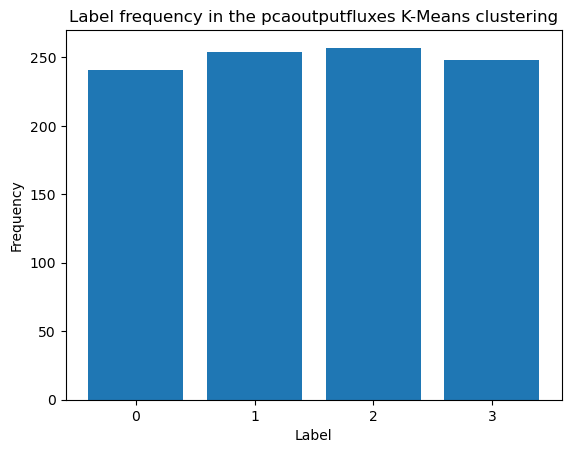

In [113]:
plot_cluster_labels_count(kmeans_labels, 
                          'K-Means',
                          'pcaoutputfluxes')

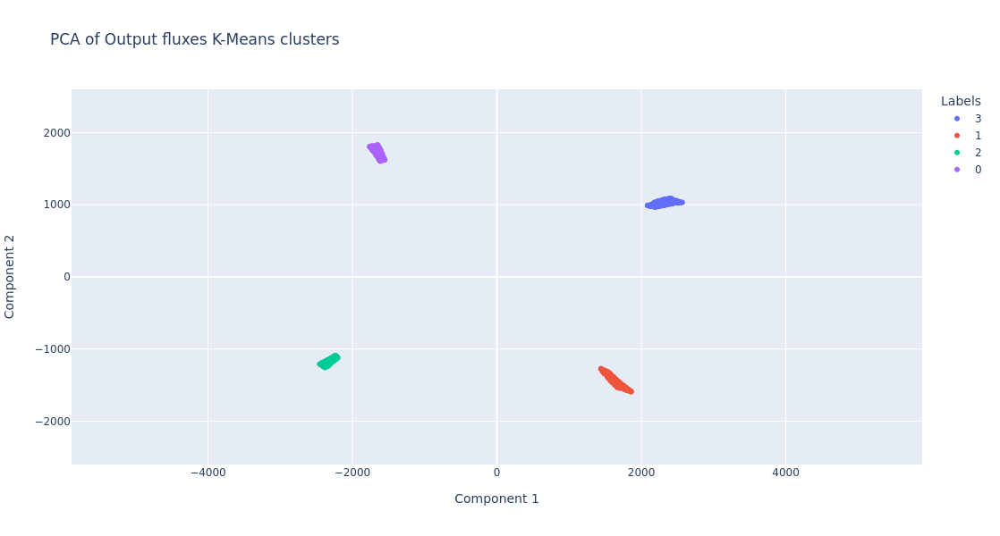

In [114]:
plot_clusters_from_labels(pca_output_fluxes,
                          kmeans_labels,
                          'PCA of Output fluxes K-Means clusters',
                          'Component 1',
                          'Component 2',
                          'pcaoutputfluxes',
                          'K-Means',
                          axis_range=[-2600, 2600])

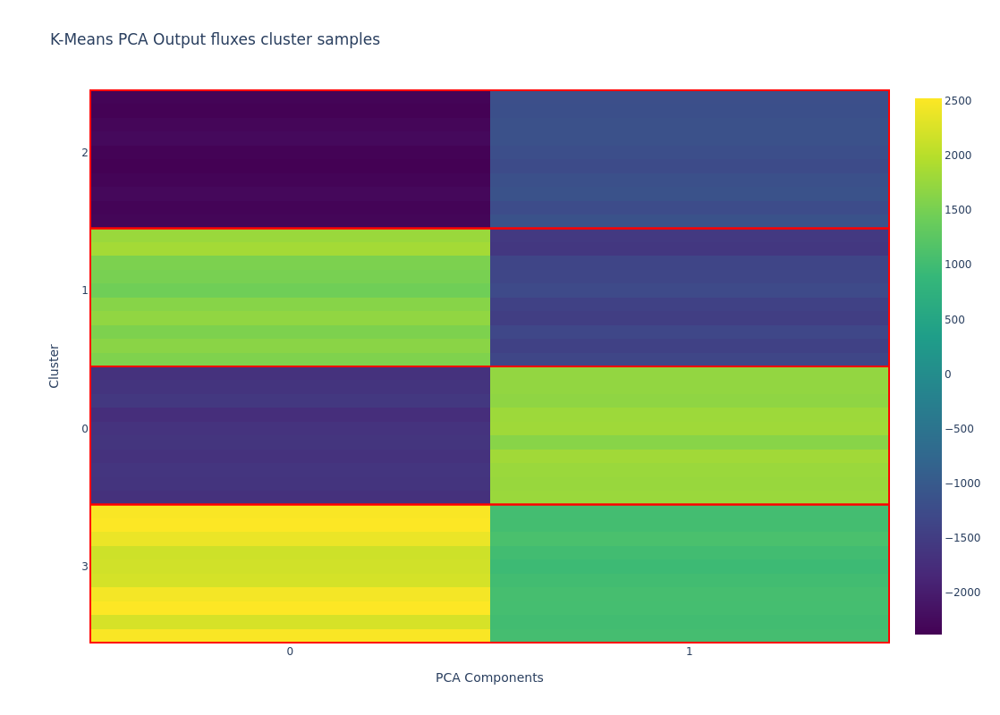

In [115]:
plot_grid_clusters(
    pca_output_fluxes,
    kmeans_labels,
    [3,0,1,2],
    "K-Means PCA Output fluxes cluster samples",
    "PCA Components",
    "Cluster",
    1,
    'pcaoutputfluxes',
    'K-Means'
    )

### DBSCAN

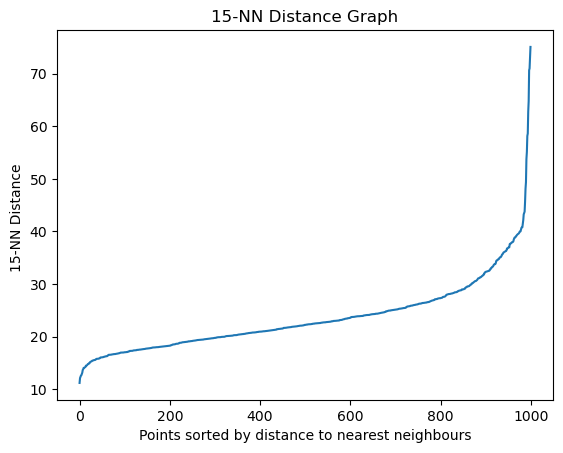

Number of clusters: 4
Numbers that are not noise: 1000


In [116]:
n_neighbours = 15
plot_kneighbours(pca_output_fluxes, n_neighbours)
epsilon = 40
dbscan_labels = get_number_of_clusters(pca_output_fluxes, epsilon, n_neighbours)

The most repeated label is 2 with 257 occurrences.
The least repeated label is 3 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


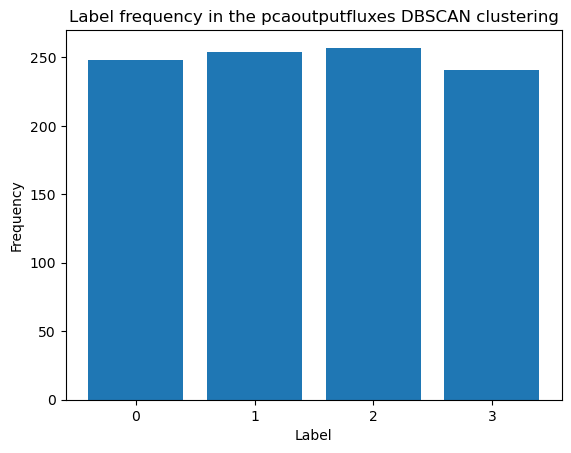

In [117]:
plot_cluster_labels_count(dbscan_labels, 'DBSCAN', 'pcaoutputfluxes')

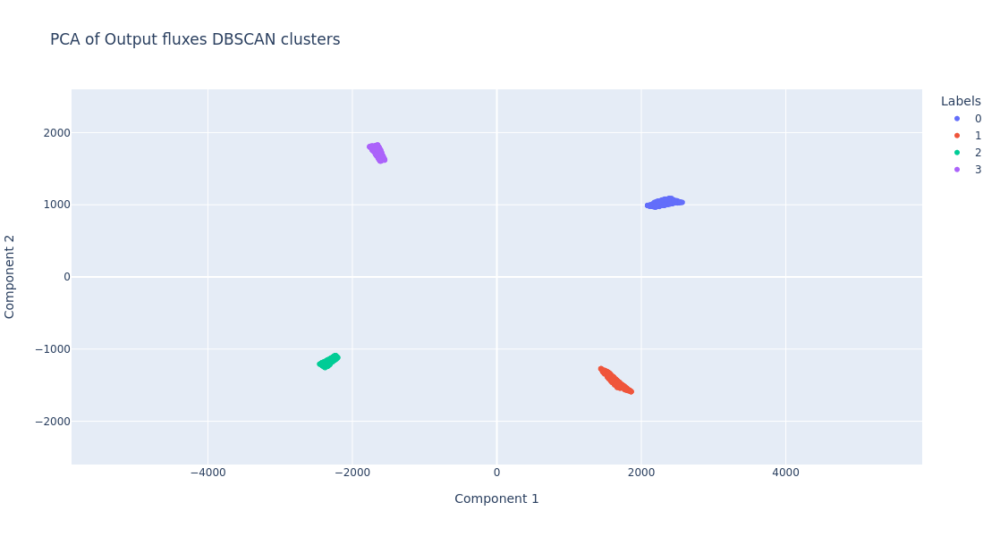

In [118]:
plot_clusters_from_labels(pca_output_fluxes,
                          dbscan_labels,
                          'PCA of Output fluxes DBSCAN clusters',
                          'Component 1',
                          'Component 2',
                          'pcaoutputfluxes',
                          'DBSCAN',
                          axis_range=[-2600, 2600])

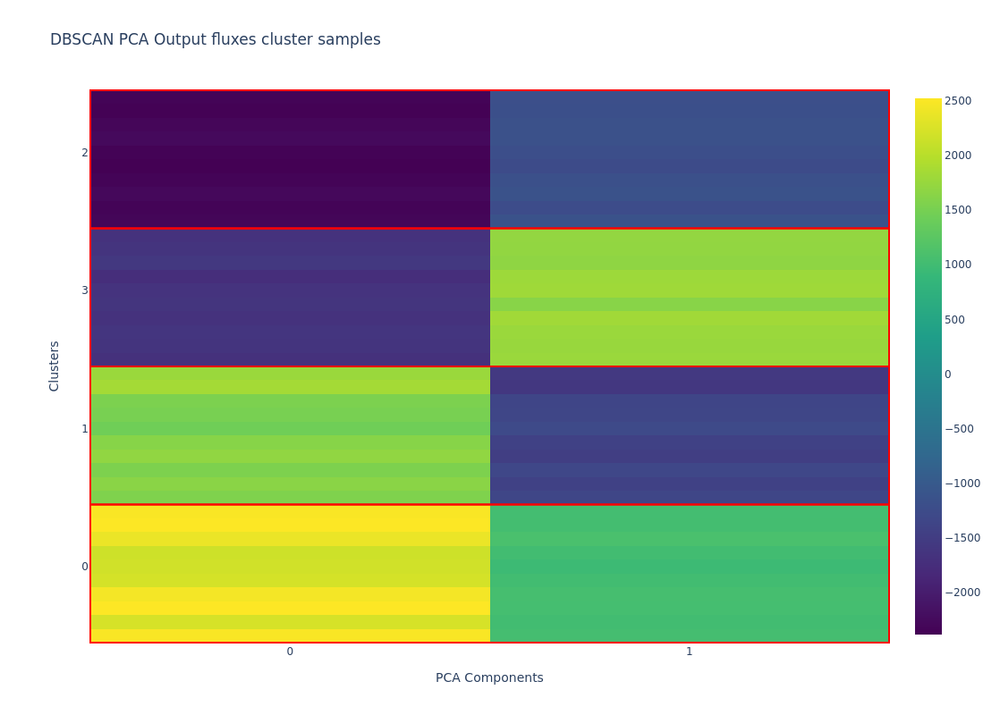

In [119]:
plot_grid_clusters(
    pca_output_fluxes,
    dbscan_labels,
    [0,1,3,2],
    "DBSCAN PCA Output fluxes cluster samples",
    "PCA Components",
    "Clusters",
    1,
    'pcaoutputfluxes',
    'DBSCAN'
    )

### HDBSCAN

In [120]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=21)
hdbscan_labels = clusterer.fit_predict(pca_output_fluxes)

The most repeated label is 1 with 257 occurrences.
The least repeated label is 0 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


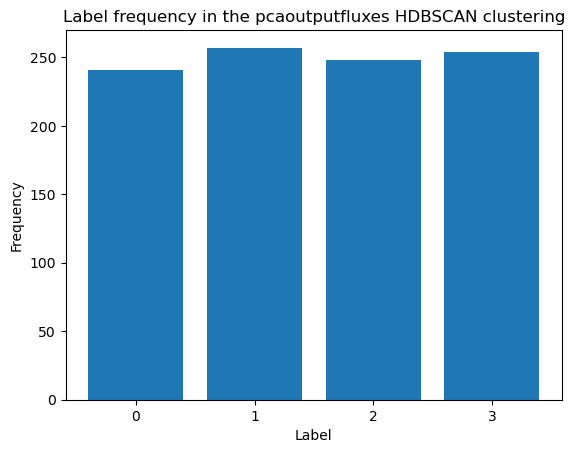

In [121]:
plot_cluster_labels_count(hdbscan_labels, 'HDBSCAN', 'pcaoutputfluxes')

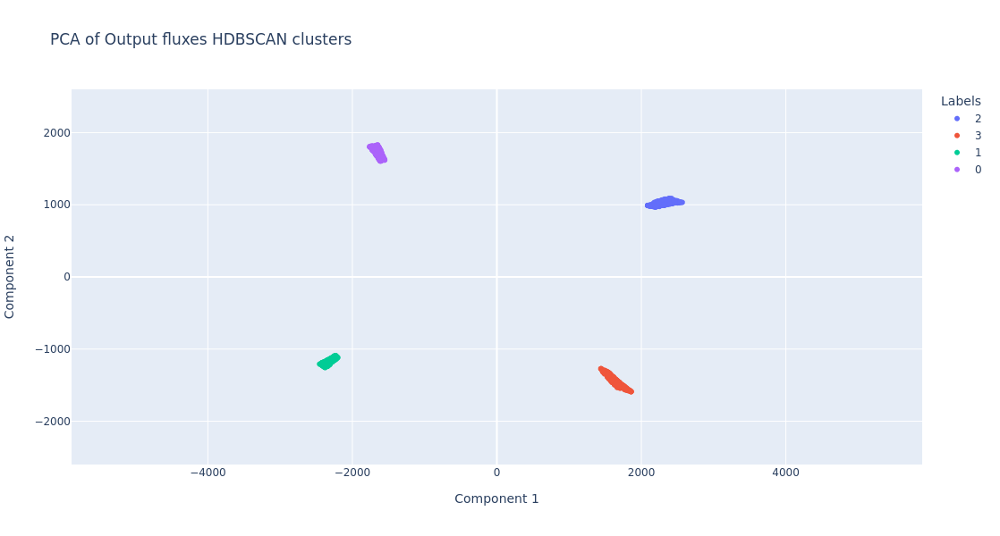

In [122]:
plot_clusters_from_labels(pca_output_fluxes,
                          hdbscan_labels,
                          'PCA of Output fluxes HDBSCAN clusters',
                          'Component 1',
                          'Component 2',
                          'pcaoutputfluxes',
                          'HDBSCAN',
                          axis_range=[-2600, 2600]
                          )

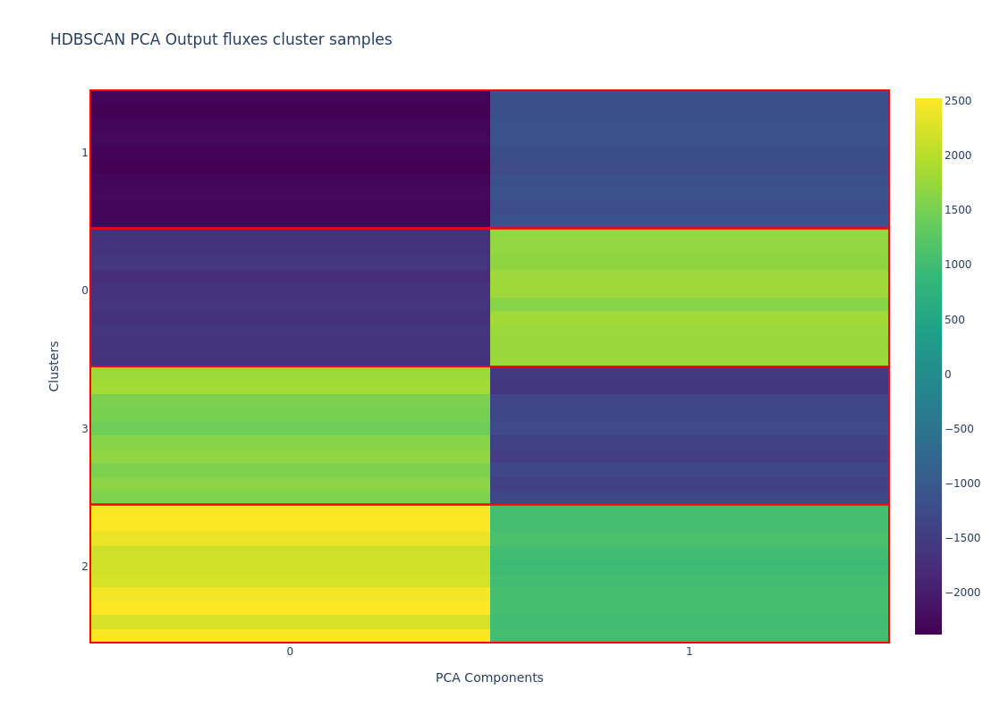

In [123]:
plot_grid_clusters(
    pca_output_fluxes,
    hdbscan_labels,
    [2,3,0,1],
    "HDBSCAN PCA Output fluxes cluster samples",
    "PCA Components",
    "Clusters",
    1,
    'pcaoutputfluxes',
    'HDBSCAN'
    )

### Agglomerative clustering

In [124]:
agglomerativeclustering = AgglomerativeClustering(n_clusters=4)
agglomerative_labels = agglomerativeclustering.fit_predict(pca_output_fluxes)

The most repeated label is 3 with 257 occurrences.
The least repeated label is 2 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


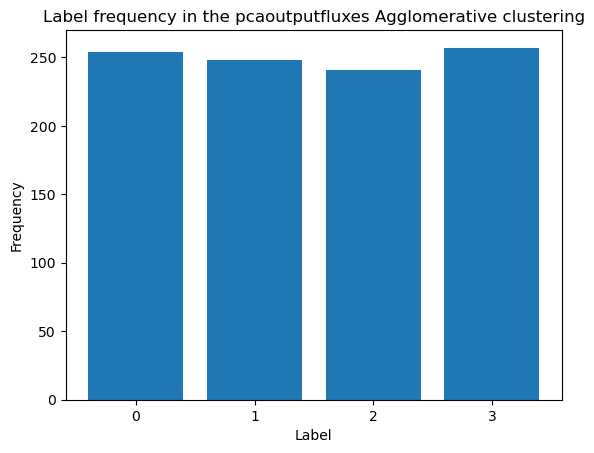

In [125]:
plot_cluster_labels_count(agglomerative_labels, 
                          'Agglomerative',
                         'pcaoutputfluxes')

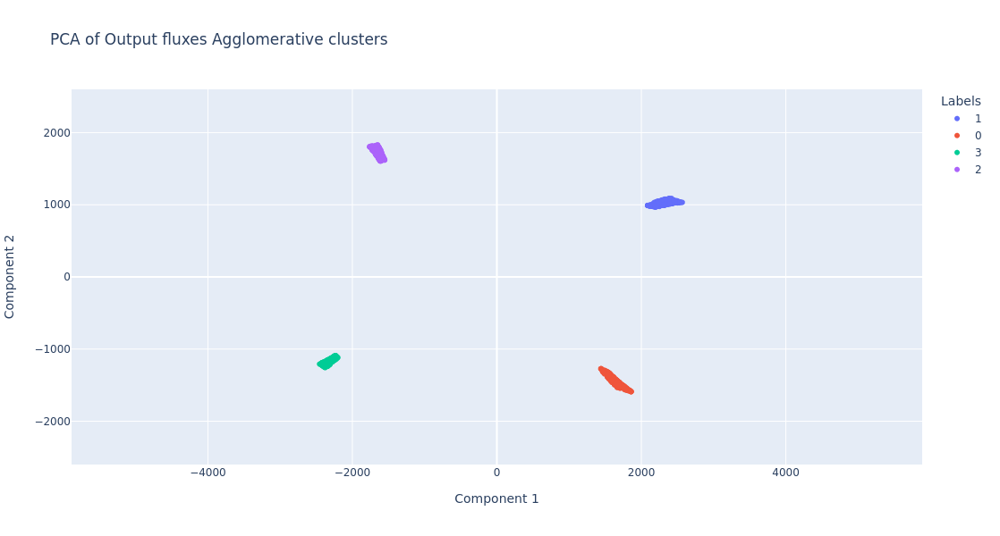

In [126]:
plot_clusters_from_labels(pca_output_fluxes,
                          agglomerative_labels,
                          'PCA of Output fluxes Agglomerative clusters',
                          'Component 1',
                          'Component 2',
                          'pcaoutputfluxes',
                          'Agglomerative',
                          axis_range=[-2600, 2600])

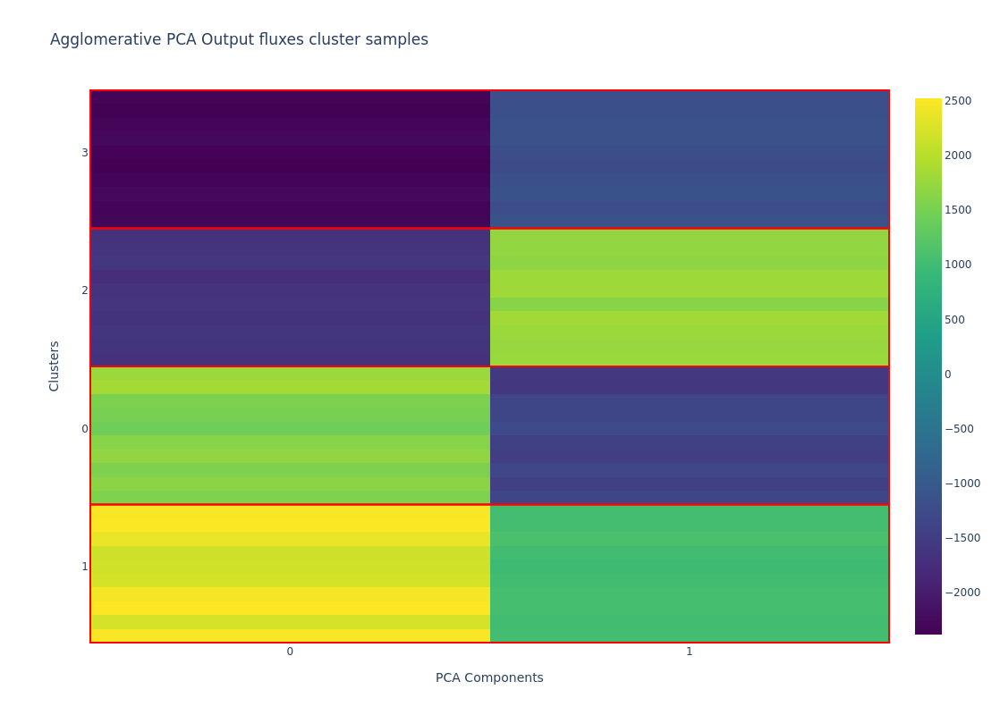

In [127]:
plot_grid_clusters(
    pca_output_fluxes,
    agglomerative_labels,
    [1,0,2,3],
    "Agglomerative PCA Output fluxes cluster samples",
    "PCA Components",
    "Clusters",
    1,
    'pcaoutputfluxes',
    'Agglomerative'
    )

In [128]:
print(normalized_mutual_info_score(kmeans_labels, original_labels))
print(normalized_mutual_info_score(dbscan_labels, original_labels))
print(normalized_mutual_info_score(hdbscan_labels, original_labels))
print(normalized_mutual_info_score(agglomerative_labels, original_labels))
print()

print(normalized_mutual_info_score(dbscan_labels, kmeans_labels))
print(normalized_mutual_info_score(hdbscan_labels, kmeans_labels))
print(normalized_mutual_info_score(agglomerative_labels, kmeans_labels))

print()
print(normalized_mutual_info_score(hdbscan_labels, dbscan_labels))
print(normalized_mutual_info_score(agglomerative_labels, dbscan_labels))

print()
print(normalized_mutual_info_score(agglomerative_labels, original_labels))

1.0
1.0
1.0
1.0

1.0
1.0
1.0

1.0
1.0

1.0


# Clustering UMAP Output fluxes

In [129]:
umap_output_fluxes = np.load(minidataset_2m_dict['umap_output_fluxes_path'])

The most repeated label is 2 with 257 occurrences.
The least repeated label is 1 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


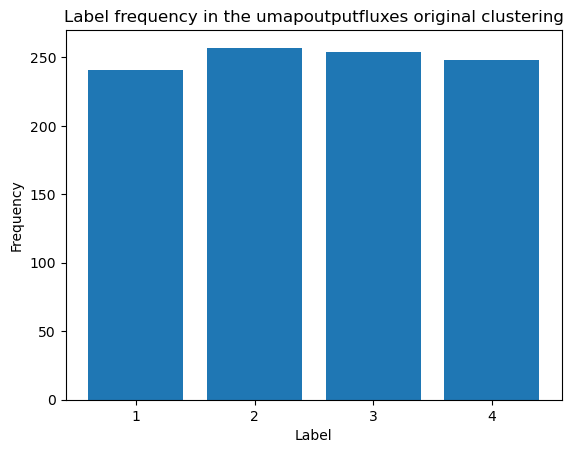

In [130]:
plot_cluster_labels_count(original_labels, 
                          'original',
                          'umapoutputfluxes')

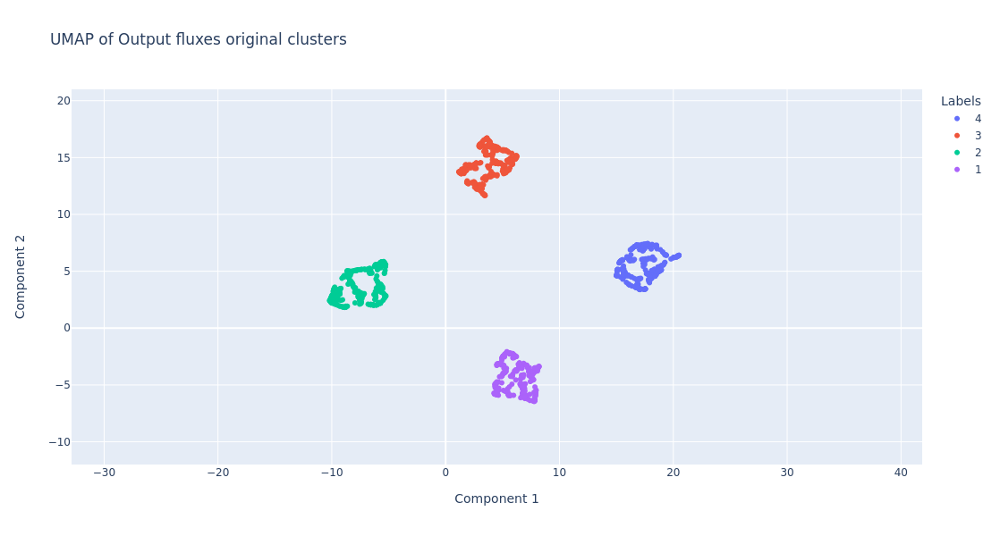

In [131]:
plot_clusters_from_labels(umap_output_fluxes,
                          original_labels,
                          'UMAP of Output fluxes original clusters',
                          'Component 1',
                          'Component 2',
                          'umapoutputfluxes',
                          'original',
                          axis_range=[-12, 21])

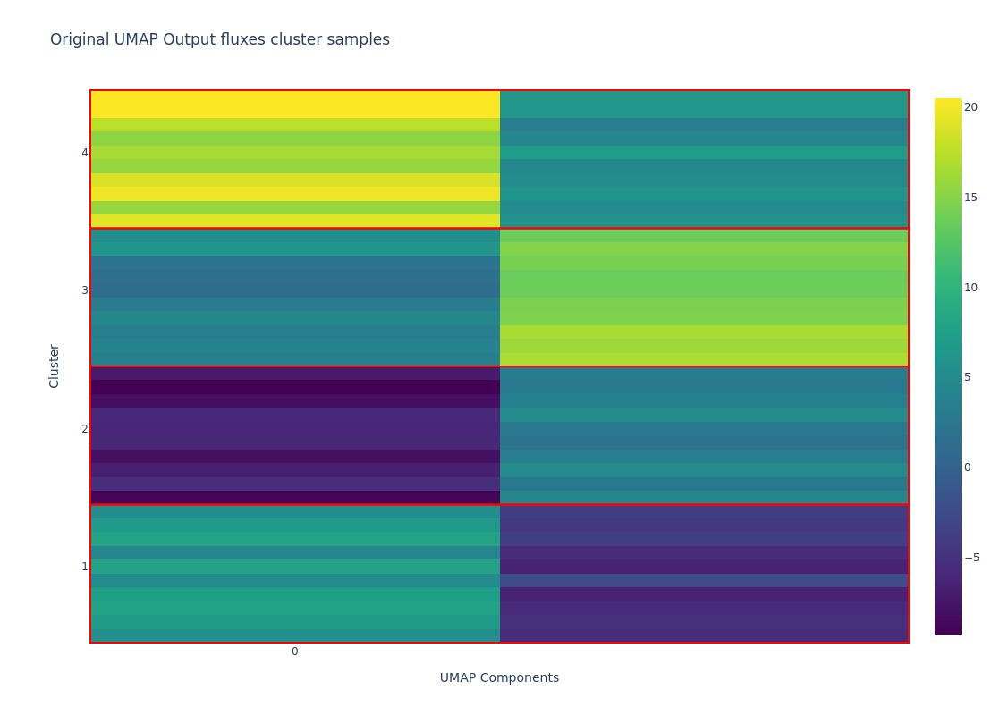

In [132]:
plot_grid_clusters(
    umap_output_fluxes,
    original_labels,
    [1,2,3,4],
    "Original UMAP Output fluxes cluster samples",
    "UMAP Components",
    "Cluster",
    19,
    'umapoutputfluxes',
    'original'
    )

### K-Means

In [133]:
kmeans = KMeans(n_clusters=4,
                n_init=10)
kmeans_labels = kmeans.fit_predict(umap_output_fluxes)

The most repeated label is 2 with 257 occurrences.
The least repeated label is 1 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


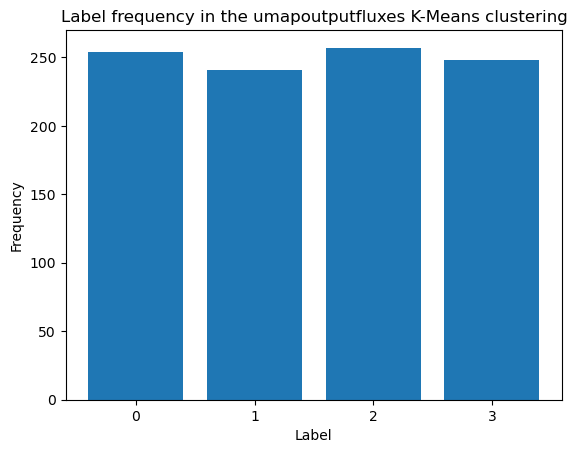

In [134]:
plot_cluster_labels_count(kmeans_labels, 
                          'K-Means',
                          'umapoutputfluxes')

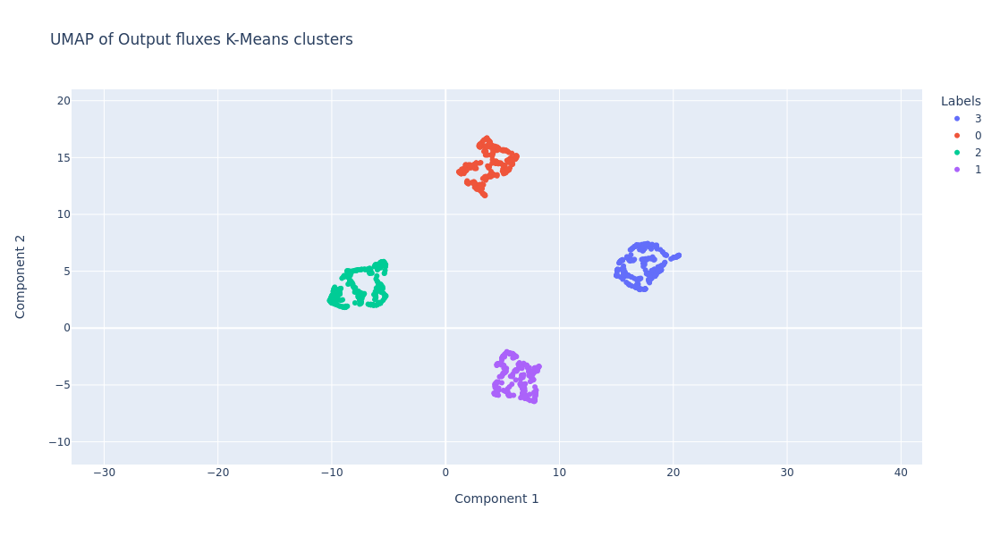

In [135]:
plot_clusters_from_labels(umap_output_fluxes,
                          kmeans_labels,
                          'UMAP of Output fluxes K-Means clusters',
                          'Component 1',
                          'Component 2',
                          'umapoutputfluxes',
                          'K-Means',
                          axis_range=[-12, 21])

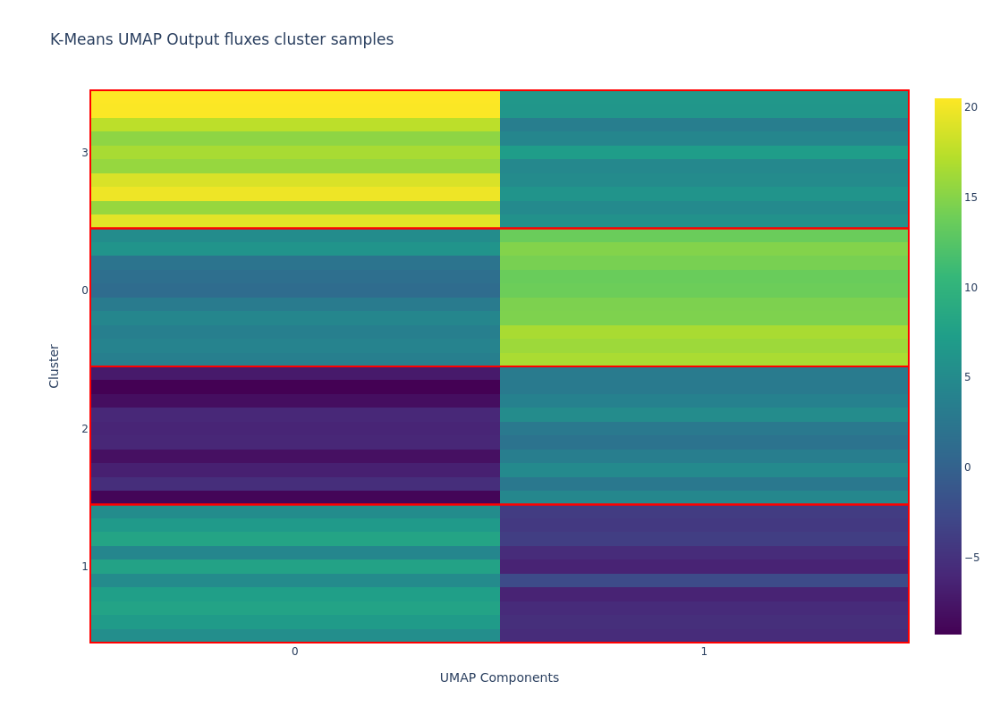

In [136]:
plot_grid_clusters(
    umap_output_fluxes,
    kmeans_labels,
    [1,2,0,3],
    "K-Means UMAP Output fluxes cluster samples",
    "UMAP Components",
    "Cluster",
    1,
    'umapoutputfluxes',
    'K-Means'
    )

### DBSCAN

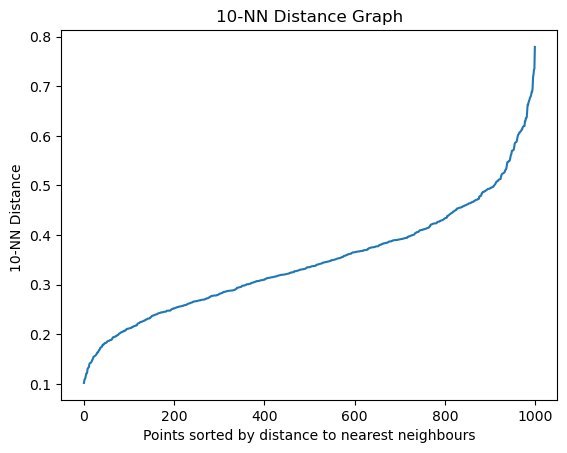

Number of clusters: 4
Numbers that are not noise: 1000


In [137]:
n_neighbours = 10
plot_kneighbours(umap_output_fluxes, n_neighbours)
epsilon = 0.85
dbscan_labels = get_number_of_clusters(umap_output_fluxes, epsilon, n_neighbours)

The most repeated label is 2 with 257 occurrences.
The least repeated label is 3 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


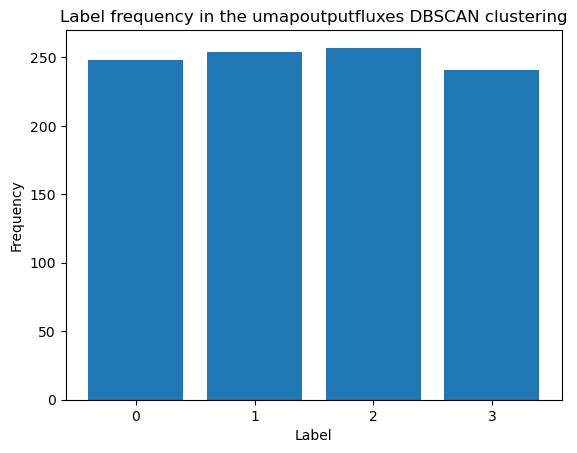

In [138]:
plot_cluster_labels_count(dbscan_labels, 
                          'DBSCAN', 
                          'umapoutputfluxes')

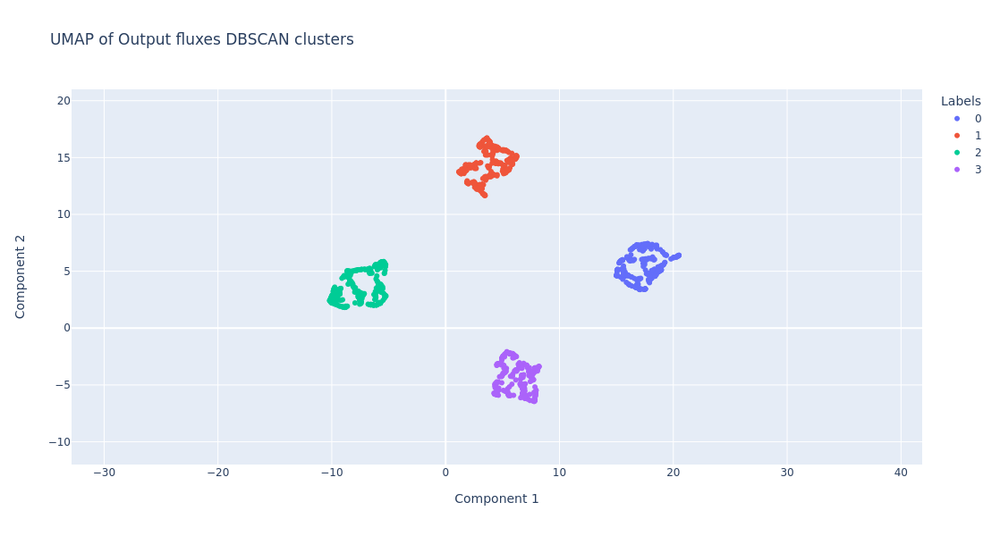

In [139]:
plot_clusters_from_labels(umap_output_fluxes,
                          dbscan_labels,
                          'UMAP of Output fluxes DBSCAN clusters',
                          'Component 1',
                          'Component 2',
                          'umapoutputfluxes',
                          'DBSCAN',
                          axis_range=[-12, 21])

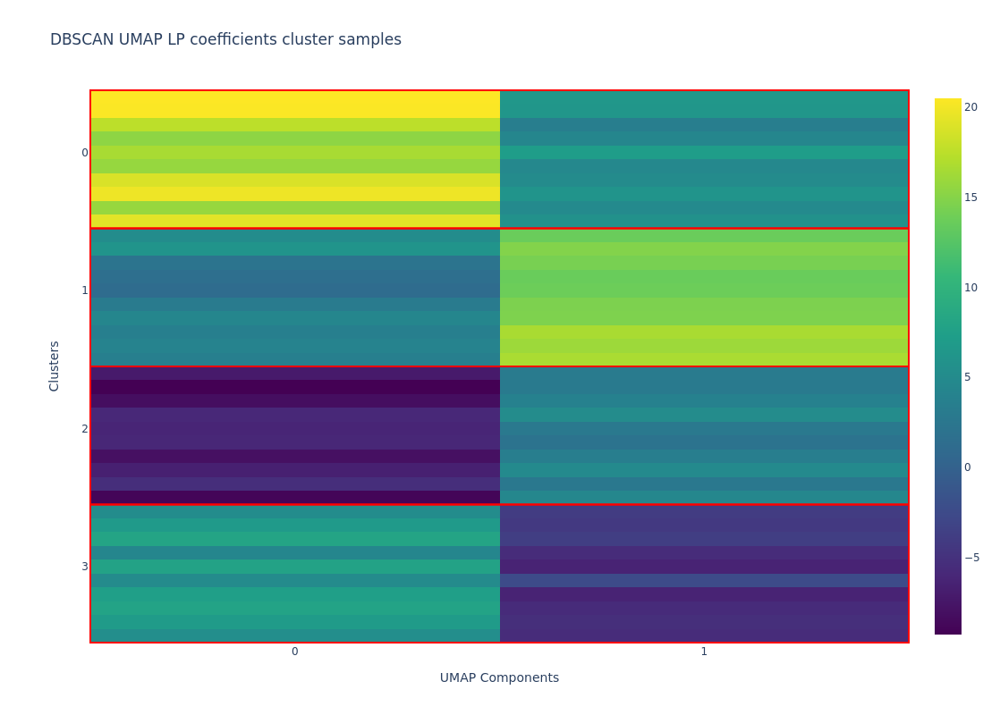

In [140]:
plot_grid_clusters(
    umap_output_fluxes,
    dbscan_labels,
    [3,2,1,0],
    "DBSCAN UMAP LP coefficients cluster samples",
    "UMAP Components",
    "Clusters",
    1,
    'umapoutputfluxes',
    'DBSCAN'
    )

### HDBSCAN

In [141]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=25)
hdbscan_labels = clusterer.fit_predict(umap_output_fluxes)

The most repeated label is 3 with 257 occurrences.
The least repeated label is 0 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


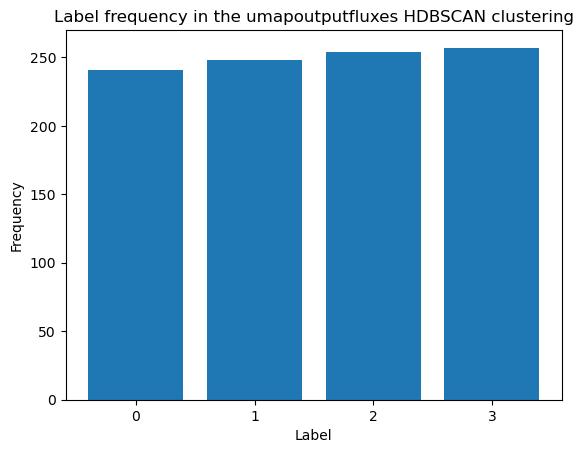

In [142]:
plot_cluster_labels_count(hdbscan_labels, 'HDBSCAN', 'umapoutputfluxes')

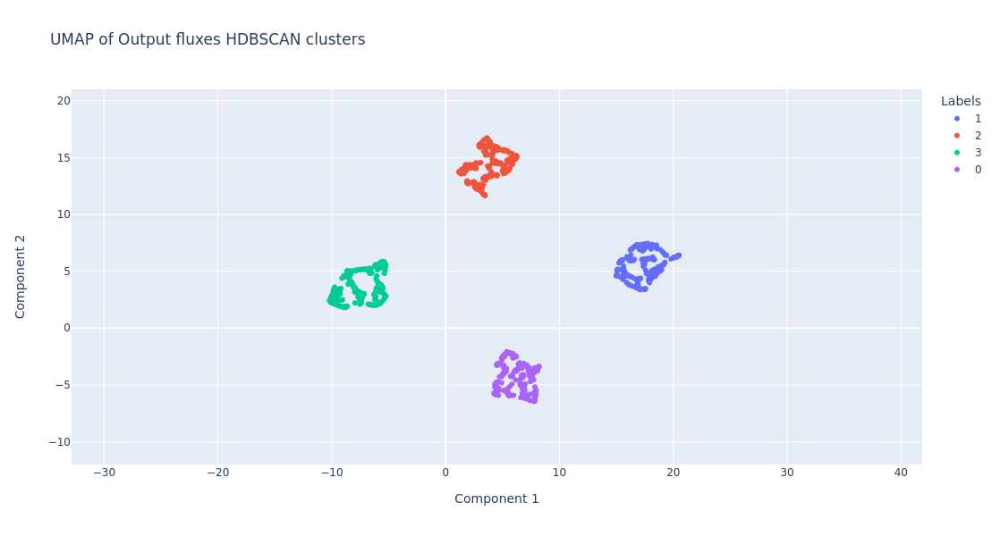

In [143]:
plot_clusters_from_labels(umap_output_fluxes,
                          hdbscan_labels,
                          'UMAP of Output fluxes HDBSCAN clusters',
                          'Component 1',
                          'Component 2',
                          'umapoutputfluxes',
                          'HDBSCAN',
                          axis_range=[-12, 21]
                          )

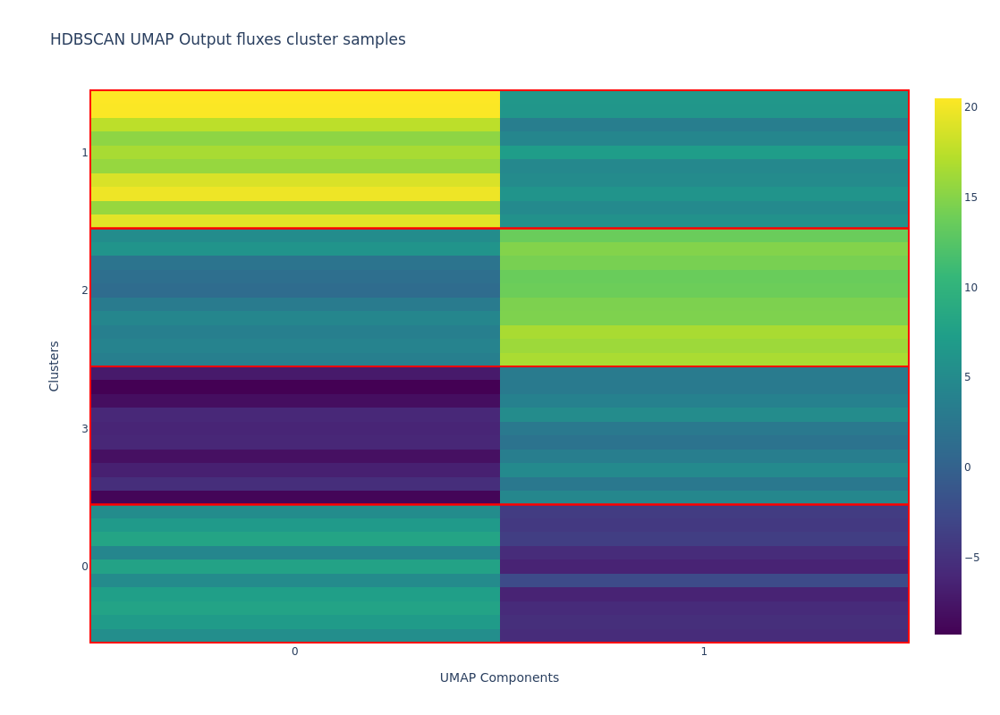

In [144]:
plot_grid_clusters(
    umap_output_fluxes,
    hdbscan_labels,
    [0,3,2,1],
    "HDBSCAN UMAP Output fluxes cluster samples",
    "UMAP Components",
    "Clusters",
    1,
    'umapoutputfluxes',
    'HDBSCAN'
    )

### Agglomerative clustering

In [145]:
agglomerativeclustering = AgglomerativeClustering(n_clusters=4)
agglomerative_labels = agglomerativeclustering.fit_predict(umap_output_fluxes)

The most repeated label is 2 with 257 occurrences.
The least repeated label is 3 with 241 occurrence.
Cluster density mean: 250.0
Cluster density variance: 6.123724356957945


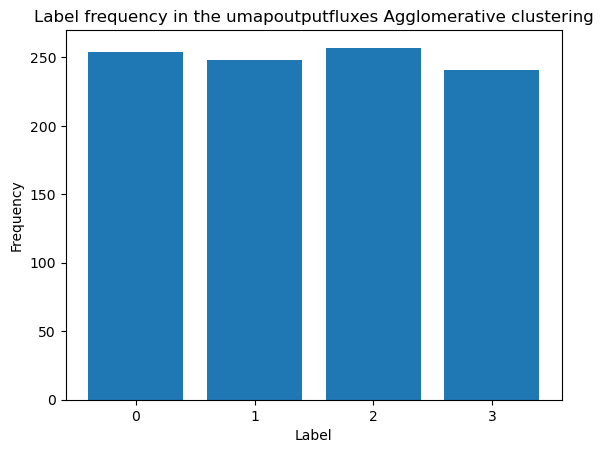

In [146]:
plot_cluster_labels_count(agglomerative_labels, 
                          'Agglomerative',
                         'umapoutputfluxes')

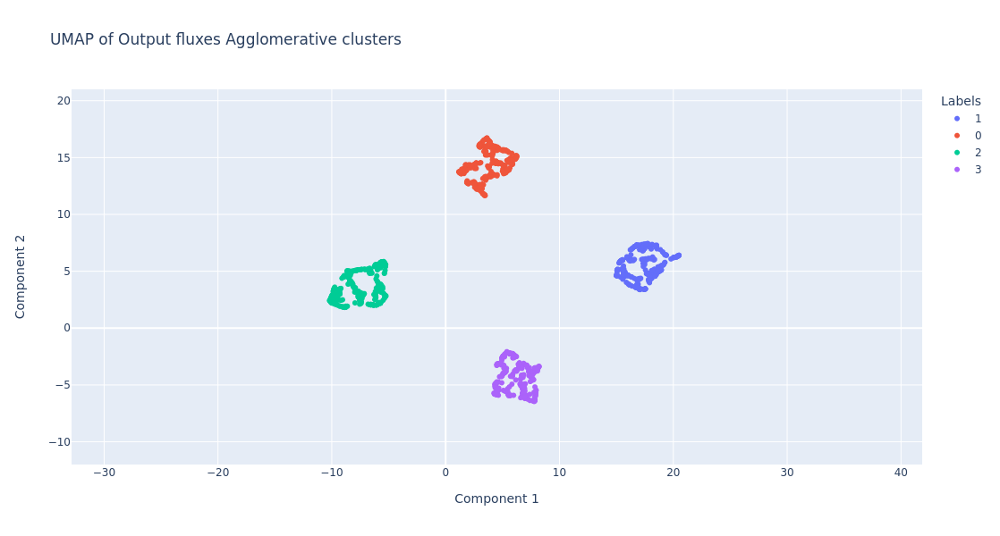

In [147]:
plot_clusters_from_labels(umap_output_fluxes,
                          agglomerative_labels,
                          'UMAP of Output fluxes Agglomerative clusters',
                          'Component 1',
                          'Component 2',
                          'umapoutputfluxes',
                          'Agglomerative',
                          axis_range=[-12, 21])

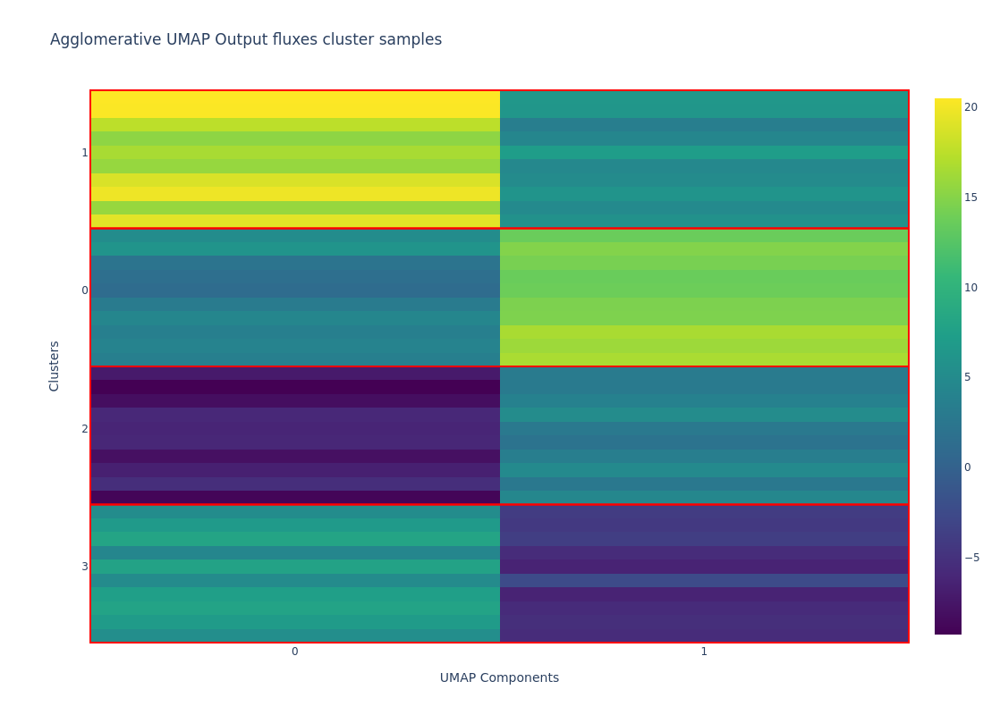

In [148]:
plot_grid_clusters(
    umap_output_fluxes,
    agglomerative_labels,
    [3,2,0,1],
    "Agglomerative UMAP Output fluxes cluster samples",
    "UMAP Components",
    "Clusters",
    1,
    'umapoutputfluxes',
    'Agglomerative'
    )

In [149]:
print(normalized_mutual_info_score(kmeans_labels, original_labels))
print(normalized_mutual_info_score(dbscan_labels, original_labels))
print(normalized_mutual_info_score(hdbscan_labels, original_labels))
print(normalized_mutual_info_score(agglomerative_labels, original_labels))
print()

print(normalized_mutual_info_score(dbscan_labels, kmeans_labels))
print(normalized_mutual_info_score(hdbscan_labels, kmeans_labels))
print(normalized_mutual_info_score(agglomerative_labels, kmeans_labels))

print()
print(normalized_mutual_info_score(hdbscan_labels, dbscan_labels))
print(normalized_mutual_info_score(agglomerative_labels, dbscan_labels))

print()
print(normalized_mutual_info_score(agglomerative_labels, original_labels))

1.0
1.0
1.0
1.0

1.0
1.0
1.0

1.0
1.0

1.0
